# L4 BMD & Microarchitecture — *Practical Pipeline v15 (YOLO26-seg, AP + LA)*

### *"The measurement of spinal bone architecture following hip surgery using X-ray datasets"*

A **practical, measurement-focused** pipeline. The L4 vertebra is segmented with a
**YOLO26-seg** instance model (instance detection naturally resolves *which* vertebra is L4 and
recovers it via a top→bottom fallback), and the measurement science is layered on top:

- **Bone Mineral Density (BMD)** — area-based density index from the *linear* (uncorrected)
  normalized intensity inside the predicted L4 ROI.
- **Bone Microarchitecture** — GLCM texture descriptors (Contrast, Correlation, Energy/ASM,
  Homogeneity) of the L4 trabecular region.
- **Evaluation** against the DICOM test ground-truth L4 masks (Dice / IoU / Precision / Recall,
  confusion matrix, Bland–Altman BMD agreement).
- **Web export** — the trained model is exported to **ONNX** for use in the web project.
- **XAI** — a gradient-based **Seg-Grad-CAM** on the L4 instance plus a **BMD-contribution heatmap**.

> ⚠️ **Clinical caveat.** Planar-radiograph "density" is an *uncorrected radiological proxy*
> (pixel intensity), **not** true areal BMD (g/cm²). Absolute BMD needs DXA/QCT or an in-image
> calibration phantom. Values below are relative indices for methodological demonstration.

---

### What changed in **v15**
1. **Much faster Step 2 training.** Root causes fixed: `workers=0` -> `WORKERS` (parallel loading, GPU no
   longer starved); no cache -> `CACHE="ram"` (images decoded once, not every epoch); `batch=-1` (~3 GB) ->
   `BATCH=0.85` (fills ~85% VRAM). Tunable knobs live in the config cell.
2. **Faster dataset prep.** `build_yolo_dataset` now skips the rebuild if the dataset already exists
   (`FORCE_REBUILD_DATA`), reads image sizes from headers (no full decode), and copies in parallel.

### What changed in **v14**
1. **Clinical L1~L4 averaged spine BMD.** Reusing the L1~L5 masks the model already produces,
   `compute_spine_bmd` measures each vertebra's trabecular BMD (trimmed + soft-tissue-relative)
   and reports their **L1-L4 mean** (the DXA lumbar convention) - more robust than a single L4.
   Step 6b saves per-vertebra + mean values to `metrics/L1L4_spine_bmd.csv`.

### What changed in **v13**
1. **Robust BMD normalization.** `gray_lin` now uses the same 0.5/99.5-percentile window as the
   display image (was raw min/max), so a hot/dead pixel no longer skews the intensity index.
2. **Trabecular ROI.** `trabecular_roi` erodes the cortical rim and strips the superior/inferior
   endplate bands, so intensity/GLCM reflect cancellous bone (replaces the crude centroid shrink).
3. **Trimmed mean + device-robust relative index.** `bmd_trimmed` (10-90% trimmed) is the main
   index; `bmd_rel = bmd_trimmed / paraspinal soft-tissue reference` cancels exposure/gain drift.

### What changed in **v12**
1. **XAI 1 Seg-Grad-CAM now spans L1~L5 (whole spine), not just L4.** One backward pass on the
   SUMMED L1..L5 instance-mask score yields a GAP Grad-CAM that lights every lumbar vertebra.
2. **Per-vertebra contour colours** — L1 red, L2 orange, L3 yellow, L4 green, L5 blue, with a legend.

### What changed in **v11**
1. **XAI 1 = spine-flow + dual CAM.** Draws all **L1~L5** instance contours (thin) for a spine
   overview, and from ONE backward pass derives two maps: **cam_full = GAP Grad-CAM** (broad/honest,
   row 1, kept wide) and **cam_focus = HiResCAM** (sharp, used for the L4-focused zoom in row 2 so the
   density reads clearly). Fixes v10 where the zoom showed no heatmap; restores savefig; 1 backward +
   1 forward per sample instead of 6 backward passes.

### What changed in **v9**
1. **XAI 1 Seg-Grad-CAM fixed & sharpened.** (a) Read the YOLO26 NMS-free head correctly (decoded det [N,6+K] + proto [K,P,P]) so the L4 mask coefficients match the 32 prototypes (v8 mis-indexed them -> RuntimeError / blank). (b) Switched Grad-CAM -> **HiResCAM** (element-wise grad ⊙ activation, no global pooling) with robust 99th-pct normalization so the heat concentrates on the L4/lumbar body instead of scattering over pelvis/femur. (c) L4 outline in the zoom row is now a thin, precise matplotlib contour of the smooth soft mask.

### What changed in **v8**
1. **XAI 1 restored to gradient-based Seg-Grad-CAM.** v7 had swapped XAI 1 for a gradient-free
   segmentation-confidence heatmap; v8 brings back the true Seg-Grad-CAM that back-propagates the
   L4 *instance*-mask probability to the P3 (stride-8) neck layer, so attribution lands on the L4
   body. The GT-matched `l4_mask_for` helper (reused by XAI 2) is kept.

### What changed in **v7**
1. **Multi-view training: AP (frontal) + LA (lateral).** Step 2 now trains a single YOLO26-seg model
   on **both** `BUU-LSPINE-2000/AP` and `BUU-LSPINE-2000/LA` (2000 + 2000 = 4000 X-rays). Views are
   controlled by the `VIEWS` list — set `["AP"]`, `["LA"]`, or both. L1..L5 are the same 5 anatomical
   classes in either view, so the model becomes **view-robust** rather than getting separate classes.
2. **LA label format handled.** AP labels have 10 rows (5 vertebrae × 2 endplate lines); **LA labels
   have 11 rows** — an extra bottom-most line (S1/sacrum endplate). The top 10 rows are the L1..L5
   endplates (verified geometrically), so the parser keeps the first 10 rows and drops the extra.
3. Inherited from v6: **`yolo26m-seg.pt`** backbone, **ONNX export (Step 7)**, cleaned-up code, and
   every cell visualizes + saves into an organized output tree.

> *Fallbacks if your GPU runs out of memory:* `yolo26s-seg.pt` → `yolo26n-seg.pt`. Training on both
> views doubles the image count, so expect ~2× the AP-only training time.


## 1. Clinical Definitions & Mathematical Formulation

### 1.1 Bone Mineral Density (BMD) — area-based intensity proxy
With the X-ray linearly normalized to $[0,1]$ and $\Omega_{L4}$ the predicted L4 ROI:
$$\text{BMD}_{\text{index}}=\frac{1}{|\Omega_{L4}|}\sum_{(x,y)\in\Omega_{L4}} I_{\text{norm}}(x,y),
\qquad I_{\text{norm}}=\frac{I-I_{\min}}{I_{\max}-I_{\min}}.$$
We use the **linear** (CLAHE-free) intensity for BMD so the density meaning is preserved, and report
median / std / p10 / p90 for distribution robustness.

### 1.2 Microarchitecture — Gray-Level Co-occurrence Matrix (GLCM)
Quantising the ROI to $L=32$ levels and averaging $P_\delta$ over
$\theta\in\{0,45,90,135^\circ\}$ at $d=1$:
$$\textbf{Contrast}=\sum_{i,j}(i-j)^2P(i,j),\quad \textbf{Energy/ASM}=\sum_{i,j}P(i,j)^2,$$
$$\textbf{Correlation}=\sum_{i,j}\frac{(i-\mu_i)(j-\mu_j)P(i,j)}{\sigma_i\sigma_j},\quad
\textbf{Homogeneity}=\sum_{i,j}\frac{P(i,j)}{1+|i-j|}.$$
Dense trabecular bone ⇒ high Energy/Homogeneity, low Contrast; disrupted/osteoporotic bone ⇒ higher
Contrast, lower Correlation.

## 0. Environment & Imports

Target: **Windows + RTX 5060 Laptop (CUDA)**. Requires `ultralytics` (YOLO26) and, for Step 7,
`onnxruntime`. Uncomment to install.

In [21]:
# !pip install ultralytics onnxruntime pydicom pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg \
# !             opencv-python-headless scikit-image scikit-learn matplotlib seaborn pandas

import os, glob, re, random, warnings
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from skimage.feature import graycomatrix, graycoprops
from ultralytics import YOLO

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", context="notebook")
random.seed(42); np.random.seed(42)
print("OpenCV:", cv2.__version__)

OpenCV: 4.13.0


## 2. Configuration & Paths

All outputs land in a single organized tree (`OUT_DIR`), and a small `savefig()` helper writes every
figure into `figures/` so each cell leaves a saved artifact behind.

In [ ]:
# -------------------- Data paths (multi-view: AP frontal + LA lateral) --------------------
BUU_ROOT = "./BUU-LSPINE-2000"
VIEWS    = ["AP", "LA"]                    # views to train on: ["AP"], ["LA"], or both
def view_dirs(view):
    base = os.path.join(BUU_ROOT, view)
    return os.path.join(base, "images"), os.path.join(base, "labels")

TEST_DCM_DIR  = "./dataset-dcm/test/gather"
TEST_MASK_DIR = "./dataset-dcm/test/gather_mask/SegmentationClass"   # L4 ground-truth (PNG, AP)

# -------------------- Output tree --------------------
OUT_DIR     = "./l4_v7_output"
FIG_DIR     = os.path.join(OUT_DIR, "figures")        # every cell's visualization
SEG_DIR     = os.path.join(OUT_DIR, "segmentation")   # per-image overlays + masks
METRICS_DIR = os.path.join(OUT_DIR, "metrics")        # CSVs
EXPORT_DIR  = os.path.join(OUT_DIR, "export")         # ONNX model for the web project
for _d in (OUT_DIR, FIG_DIR, SEG_DIR, METRICS_DIR, EXPORT_DIR):
    os.makedirs(_d, exist_ok=True)

def savefig(fig, name, dpi=150):
    '''Save a figure into FIG_DIR and return its path (call right before plt.show()).'''
    path = os.path.join(FIG_DIR, name)
    fig.savefig(path, dpi=dpi, bbox_inches="tight")
    return path

# -------------------- Model / Training --------------------
YOLO_BASE      = "yolo26m-seg.pt"          # YOLO26 medium SEG backbone (fallback: -s / -n)
# IMPORTANT: pass an ABSOLUTE project path. In ultralytics 8.4.x, a *relative* `project` is
# re-nested under RUNS_DIR/<task>/, so project="runs/segment/ap_seg" would be written to
# runs/segment/runs/segment/ap_seg/... (the doubled 'runs/segment' you saw). An absolute path
# is used verbatim -> runs/segment/ap_seg/<name>/ exactly.
YOLO_PROJECT   = os.path.abspath(os.path.join("runs", "segment", "ap_seg"))
YOLO_NAME      = "l1_l5_yolo26m_" + "_".join(v.lower() for v in VIEWS)  # e.g. l1_l5_yolo26m_ap_la
YOLO_WEIGHTS   = os.path.join(YOLO_PROJECT, YOLO_NAME, "weights", "best.pt")
YOLO_DATA_ROOT = os.path.abspath("yolo_ap_la_seg")     # converted multi-view YOLO-seg dataset
CONF           = 0.25

# Training controls. The 42 DICOMs are TEST-ONLY.
# First run with a new view set has no best.pt yet -> Step 2 trains automatically.
RETRAIN   = False     # True -> force retrain from YOLO_BASE; else reuse best.pt if present
EPOCHS    = 100
IMGSZ     = 640
VAL_RATIO = 0.15
SEED      = 42
# ---- Training speed / hardware (v15) ----
BATCH   = 0.85               # GPU-memory fraction (float) -> target ~85% VRAM. Use an int (e.g. 16) on ultralytics < 8.1.
WORKERS = 8                  # dataloader workers (parallel image loading). If training HANGS at start on Windows, set 0.
CACHE   = "ram"              # cache decoded images once: "ram" (fastest, ~5 GB for 4k imgs) | "disk" | False.
FORCE_REBUILD_DATA = False   # rebuild the YOLO-seg dataset even if it already exists on disk

random.seed(SEED); np.random.seed(SEED)

# -------------------- Task --------------------
CLASS_NAMES = ["L1", "L2", "L3", "L4", "L5"]
L4_IDX      = CLASS_NAMES.index("L4")     # = 3
GLCM_LEVELS = 32
ROI_SHRINK  = 0.85                        # shrink mask toward centre -> cancellous-bone ROI

print(f"Backbone     : {YOLO_BASE}")
print(f"Views        : {VIEWS}")
print(f"Project dir  : {YOLO_PROJECT}")
print(f"Weights path : {YOLO_WEIGHTS}")
print("Status       :", "found (reuse)" if os.path.exists(YOLO_WEIGHTS)
      else "absent -> Step 2 will train on BUU-LSPINE-2000")
print(f"Output tree  : {OUT_DIR}/  (figures, segmentation, metrics, export)")

### Image loaders (JPG / DICOM)

Each loader returns **two views** of one X-ray:
- `rgb_uint8` — a display-normalized 3-channel image **fed to YOLO** (bright bone, percentile-windowed;
  MONOCHROME1 DICOMs are inverted).
- `gray_lin` — a **linear** min–max normalized grayscale used for **BMD/GLCM** (no CLAHE, so the
  density meaning is preserved).

In [23]:
def load_xray(path):
    '''Return (rgb_uint8 for YOLO, gray_lin float[0,1] for BMD/GLCM, H, W).
       gray_lin uses the SAME robust 0.5/99.5-percentile window as rgb, so a single hot/dead
       pixel no longer skews the BMD normalization (v13 fix).'''
    if os.path.splitext(path)[1].lower() == ".dcm":
        import pydicom
        ds  = pydicom.dcmread(path)
        raw = ds.pixel_array.astype(np.float32)
        raw = raw * float(getattr(ds, "RescaleSlope", 1.0)) + float(getattr(ds, "RescaleIntercept", 0.0))
        if str(getattr(ds, "PhotometricInterpretation", "")).upper() == "MONOCHROME1":
            raw = raw.max() - raw                       # bright bone, linear
        lo, hi = np.percentile(raw, 0.5), np.percentile(raw, 99.5)
        if hi <= lo:
            lo, hi = raw.min(), raw.max() + 1e-6
        gray_lin = np.clip((raw - lo) / (hi - lo), 0, 1).astype(np.float32)   # robust window (was raw min/max)
        rgb = cv2.cvtColor((gray_lin * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
        return rgb, gray_lin, raw.shape[0], raw.shape[1]
    g = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if g is None:
        raise FileNotFoundError(path)
    rgb = cv2.cvtColor(g, cv2.COLOR_GRAY2RGB)
    lo, hi = np.percentile(g, 0.5), np.percentile(g, 99.5)
    if hi <= lo:
        lo, hi = float(g.min()), float(g.max()) + 1e-6
    gray_lin = np.clip((g.astype(np.float32) - lo) / (hi - lo), 0, 1).astype(np.float32)
    return rgb, gray_lin, g.shape[0], g.shape[1]

def list_pairs(views=VIEWS):
    '''Images (across the given views) that have a matching label file.'''
    pairs = []
    for view in views:
        img_dir, lbl_dir = view_dirs(view)
        for lp in sorted(glob.glob(os.path.join(lbl_dir, "*"))):
            stem = os.path.splitext(os.path.basename(lp))[0]
            for ext in (".jpg", ".jpeg", ".png"):
                ip = os.path.join(img_dir, stem + ext)
                if os.path.exists(ip):
                    pairs.append(ip); break
    return pairs

buu_by_view    = {v: list_pairs([v]) for v in VIEWS}     # per-view samples (for visualization)
buu_imgs       = [p for v in VIEWS for p in buu_by_view[v]]
test_dcm_files = sorted(glob.glob(os.path.join(TEST_DCM_DIR, "*.dcm")))
eval_items     = [p for p in test_dcm_files
                  if os.path.exists(os.path.join(TEST_MASK_DIR,
                     os.path.splitext(os.path.basename(p))[0] + ".png"))]
print("BUU images per view:", {v: len(buu_by_view[v]) for v in VIEWS},
      f"| total {len(buu_imgs)}")
print(f"DICOM test: {len(test_dcm_files)} ({len(eval_items)} with L4 ground truth)")

BUU images per view: {'AP': 2000, 'LA': 2000} | total 4000
DICOM test: 42 (42 with L4 ground truth)


## Step 1 — Data Loading (visualization)

Sample raw X-rays with their intensity histograms. Saved to `figures/step1_*`.

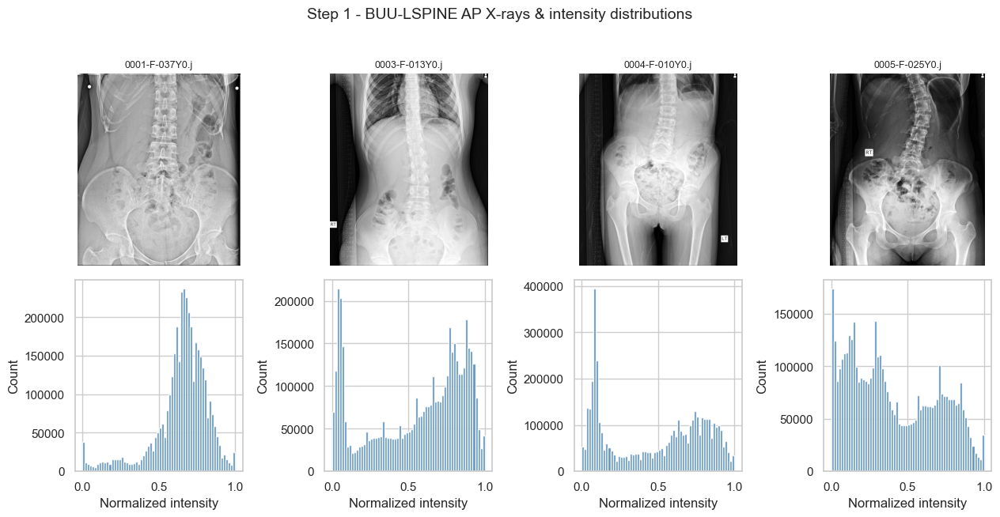

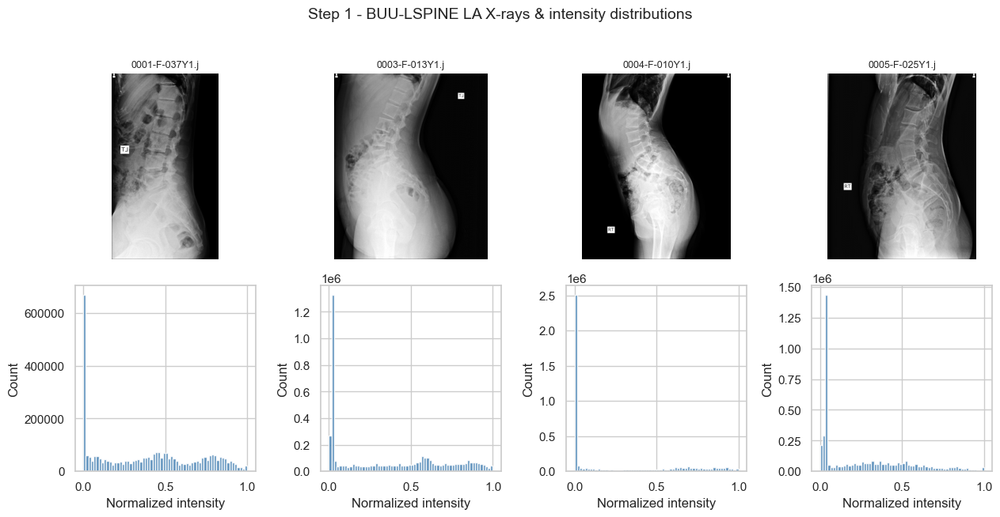

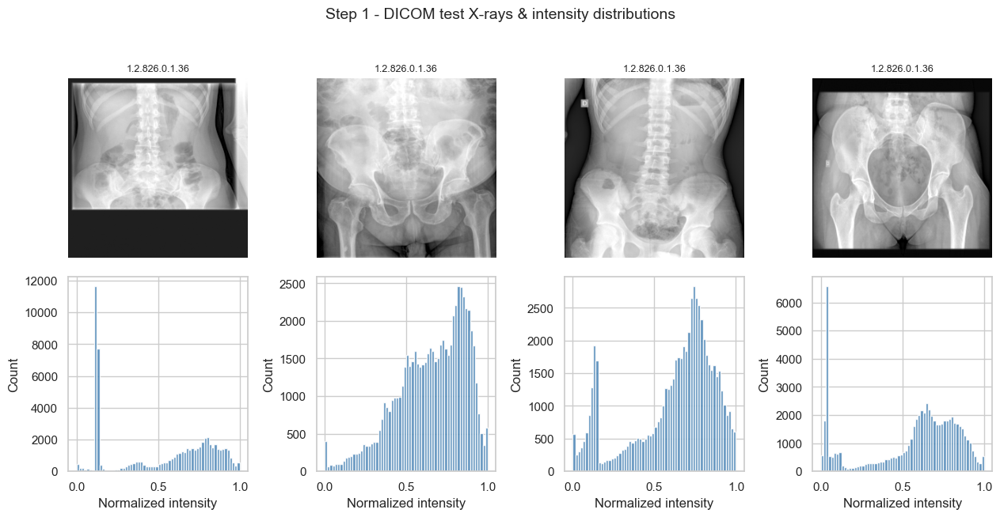

In [24]:
def show_raw_with_histograms(paths, title, savename):
    n = len(paths)
    fig, axes = plt.subplots(2, n, figsize=(3.2 * n, 6.4))
    for k, p in enumerate(paths):
        _, g, _, _ = load_xray(p)
        axes[0, k].imshow(g, cmap="gray"); axes[0, k].set_title(os.path.basename(p)[:14], fontsize=9)
        axes[0, k].axis("off")
        axes[1, k].hist(g.ravel(), bins=64, color="steelblue", alpha=0.85)
        axes[1, k].set_xlabel("Normalized intensity"); axes[1, k].set_ylabel("Count")
    fig.suptitle(title, fontsize=14, y=1.02); plt.tight_layout()
    savefig(fig, savename); plt.show()

# One panel per training view (AP frontal vs LA lateral look very different)
for view in VIEWS:
    if buu_by_view[view]:
        show_raw_with_histograms(buu_by_view[view][:4],
            f"Step 1 - BUU-LSPINE {view} X-rays & intensity distributions",
            f"step1_buu_{view.lower()}.png")
if eval_items:
    show_raw_with_histograms(eval_items[:4],
        "Step 1 - DICOM test X-rays & intensity distributions", "step1_dicom_samples.png")

## Step 2 — Train (or load) the YOLO26-seg model on **BUU-LSPINE-2000 (AP + LA)**

The L4 extractor is a **YOLO26-seg** instance model trained on **BUU-LSPINE-2000** across the views in
`VIEWS` — **AP (frontal)** and **LA (lateral)** by default (2000 + 2000 = 4000 X-rays, 5 vertebra
classes L1..L5). The 4-corner CSV labels are converted to YOLO-seg polygons and trained with a
deterministic train/val split that mixes both views.

- **`RETRAIN=False`** (default): reuse `best.pt` if present.
- **`RETRAIN=True`** *or* missing weights (e.g. first run on a new `VIEWS` set): (re)train from
  `YOLO_BASE` and write to `runs/segment/ap_seg/<YOLO_NAME>/weights/best.pt`.

> **LA label note.** AP CSVs have 10 rows (5 vertebrae × 2 endplate lines). LA CSVs have **11 rows**
> — the extra bottom-most line is an S1/sacrum endplate; the parser keeps the **top 10 rows** = L1..L5.

> The **42 DICOMs are a held-out test set** and never enter training or validation here.

In [ ]:
import shutil
from concurrent.futures import ThreadPoolExecutor

# ---- CSV (4-corner quads) -> ordered L1..L5 polygons --------------------------
def _csv_rows(path):
    out = []
    for line in open(path):
        nums = re.findall(r"-?\d+\.?\d*", line)
        if len(nums) >= 4:
            out.append([float(v) for v in nums[:4]])    # xL, yL, xR, yR
    return out

def order_quad(pts):
    '''4 points -> [TL, TR, BR, BL] (clockwise, non-self-intersecting).'''
    pts = sorted(pts, key=lambda p: p[1])
    top = sorted(pts[:2], key=lambda p: p[0])
    bot = sorted(pts[2:], key=lambda p: p[0])
    return [top[0], top[1], bot[1], bot[0]]

def parse_polys(path, n_vert=len(CLASS_NAMES), lines_per=2):
    '''Return n_vert quads ordered L1..L5 (top->bottom), or [] if malformed.
       AP has exactly 10 rows; LA has 11 (extra bottom S1 line) -> we use the top
       n_vert*lines_per rows, which are the L1..L5 endplates in both views.'''
    rows = _csv_rows(path)
    if len(rows) < lines_per * n_vert:
        return []
    rows = rows[:lines_per * n_vert]                     # keep top L1..L5 endplates, drop extras
    verts = []
    for i in range(n_vert):
        pts = []
        for j in range(lines_per):
            xL, yL, xR, yR = rows[i * lines_per + j]
            pts += [(xL, yL), (xR, yR)]
        q = order_quad(pts)
        verts.append((sum(p[1] for p in q) / 4.0, q))
    verts.sort(key=lambda v: v[0])                       # top -> bottom => L1..L5
    return [q for _, q in verts]

def _img_wh(path):
    '''(W, H) from the image header only - no full decode (fast; was cv2.imread ×4000).'''
    from PIL import Image
    with Image.open(path) as im:
        return im.size                                   # (W, H)

def _dataset_ready(root):
    '''True if the YOLO-seg dataset already looks built (data.yaml + non-empty splits).'''
    if not os.path.exists(os.path.join(root, "data.yaml")):
        return False
    ntr = len(glob.glob(os.path.join(root, "images", "train", "*")))
    nva = len(glob.glob(os.path.join(root, "images", "val", "*")))
    return ntr > 0 and nva > 0

def build_yolo_dataset(root=YOLO_DATA_ROOT, views=VIEWS, val_ratio=VAL_RATIO, seed=SEED,
                       force=FORCE_REBUILD_DATA):
    '''Convert BUU-LSPINE labels (all `views`) to one YOLO-seg dataset.
       Skips the rebuild if the dataset already exists (set force=True to rebuild).
       Copies are parallelized and sizes read from headers -> much faster prep.'''
    if not force and _dataset_ready(root):
        ntr = len(glob.glob(os.path.join(root, "images", "train", "*")))
        nva = len(glob.glob(os.path.join(root, "images", "val", "*")))
        print(f"  [skip] reusing existing dataset at {root}  (train={ntr}, val={nva}); "
              f"set FORCE_REBUILD_DATA=True to rebuild.")
        return os.path.join(root, "data.yaml"), ntr, nva

    pairs = []
    for view in views:
        img_dir, lbl_dir = view_dirs(view)
        for lp in sorted(glob.glob(os.path.join(lbl_dir, "*.csv"))):
            stem = os.path.splitext(os.path.basename(lp))[0]
            ip = next((os.path.join(img_dir, stem + e) for e in (".jpg", ".jpeg", ".png")
                       if os.path.exists(os.path.join(img_dir, stem + e))), None)
            if ip and len(parse_polys(lp)) == len(CLASS_NAMES):
                pairs.append((view, ip, lp))
    random.Random(seed).shuffle(pairs)
    n_val = int(len(pairs) * val_ratio)
    split = {"val": pairs[:n_val], "train": pairs[n_val:]}
    for sub in ["images/train", "images/val", "labels/train", "labels/val"]:
        d = os.path.join(root, sub)
        if os.path.exists(d):
            shutil.rmtree(d)
        os.makedirs(d, exist_ok=True)

    def _emit(item):
        sp, view, ip, lp = item
        ext  = os.path.splitext(ip)[1]
        stem = f"{view}_" + os.path.splitext(os.path.basename(ip))[0]      # view prefix -> unique
        W, H = _img_wh(ip)                                                 # header-only size
        shutil.copy(ip, os.path.join(root, "images", sp, stem + ext))
        with open(os.path.join(root, "labels", sp, stem + ".txt"), "w") as f:
            for cid, q in enumerate(parse_polys(lp)):
                coords = " ".join(f"{x / W:.6f} {y / H:.6f}" for x, y in q)
                f.write(f"{cid} {coords}\n")

    tasks = [(sp, view, ip, lp) for sp, plist in split.items() for (view, ip, lp) in plist]
    with ThreadPoolExecutor(max_workers=min(16, (os.cpu_count() or 4) * 2)) as ex:
        list(ex.map(_emit, tasks))                                        # parallel copy + label write

    yaml_path = os.path.join(root, "data.yaml")
    with open(yaml_path, "w") as f:
        f.write(f"path: {os.path.abspath(root)}\ntrain: images/train\nval: images/val\n")
        f.write(f"nc: {len(CLASS_NAMES)}\nnames: {CLASS_NAMES}\n")
    return yaml_path, len(split["train"]), len(split["val"])

# ---- Train (guarded) or reuse existing weights --------------------------------
if RETRAIN or not os.path.exists(YOLO_WEIGHTS):
    import torch
    if torch.cuda.is_available():
        _p = torch.cuda.get_device_properties(0)
        print(f"Device: {_p.name} ({_p.total_memory / 1e9:.1f} GB VRAM)")
    else:
        print("Device: CPU (no CUDA -> training will be slow; a GPU is strongly recommended)")
    print(f"Preparing YOLO-seg dataset from BUU-LSPINE-2000 views={VIEWS} ...")
    data_yaml, n_tr, n_va = build_yolo_dataset()
    print(f"  train={n_tr}  val={n_va}  | test DICOMs held out: {len(test_dcm_files)}")
    print(f"Training {YOLO_BASE} for {EPOCHS} epochs @ imgsz={IMGSZ} "
          f"(batch={BATCH}, cache={CACHE!r}, workers={WORKERS}) ...")
    YOLO(YOLO_BASE).train(data=data_yaml, epochs=EPOCHS, imgsz=IMGSZ,
                          batch=BATCH,        # float -> % of VRAM (fills the GPU; was -1/auto ~3 GB)
                          cache=CACHE,        # decode images once -> no per-epoch re-decode (huge speedup)
                          workers=WORKERS,    # parallel data loading -> GPU no longer starved (was 0)
                          project=YOLO_PROJECT, name=YOLO_NAME, patience=20,
                          seed=SEED, exist_ok=True)
else:
    print(f"Reusing existing weights -> {YOLO_WEIGHTS}  (set RETRAIN=True to retrain).")

print(os.path.exists(YOLO_WEIGHTS), f"Training did not produce weights at {YOLO_WEIGHTS}")
seg = YOLO(YOLO_WEIGHTS)
print("Loaded YOLO26-seg:", YOLO_WEIGHTS)

### Step 2b — Training & Validation diagnostics (BUU-LSPINE val set)

These are the **in-domain** results on the BUU-LSPINE validation split, recovered from the saved run
directory. With `RETRAIN=False` the training cell only reloads `best.pt`, so Ultralytics never
re-emits its plots — we surface them here (training curves, confusion matrix, PR curve, val-batch
predictions) so the validation result is always visible. Figures copied to `figures/step2b_*`.

Running live seg.val() on the held-out BUU val split (computed now) ...
Ultralytics 8.4.60  Python-3.12.13 torch-2.12.0.dev20260408+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Laptop GPU, 8151MiB)
YOLO26m-seg summary (fused): 149 layers, 23,511,323 parameters, 0 gradients, 121.2 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 785.8164.8 MB/s, size: 949.6 KB)
val: Scanning C:\Users\csm02\Desktop\edward\bmd\src\BMD\model\yolo_ap_la_seg\labels\val.cache... 600 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 600/600  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 38/38 1.6it/s 24.0s0.3ss
                   all        600       3000      0.979      0.977      0.992      0.871      0.978      0.977      0.992      0.825
Speed: 1.2ms preprocess, 34.3ms inference, 0.0ms loss, 0.6ms postprocess per image


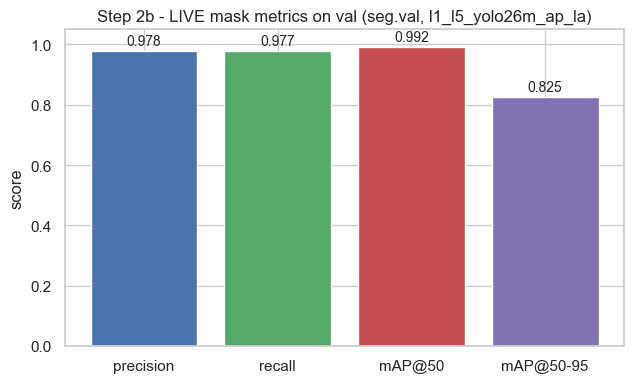

  live mask metrics: {'precision': 0.9783, 'recall': 0.9771, 'mAP@50': 0.9919, 'mAP@50-95': 0.8254}


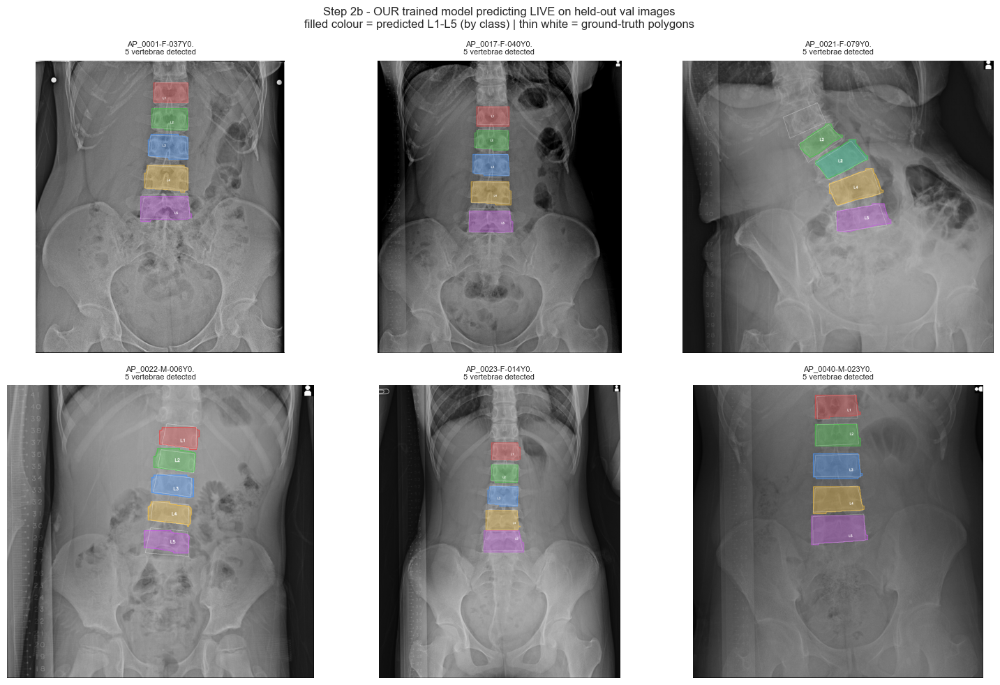

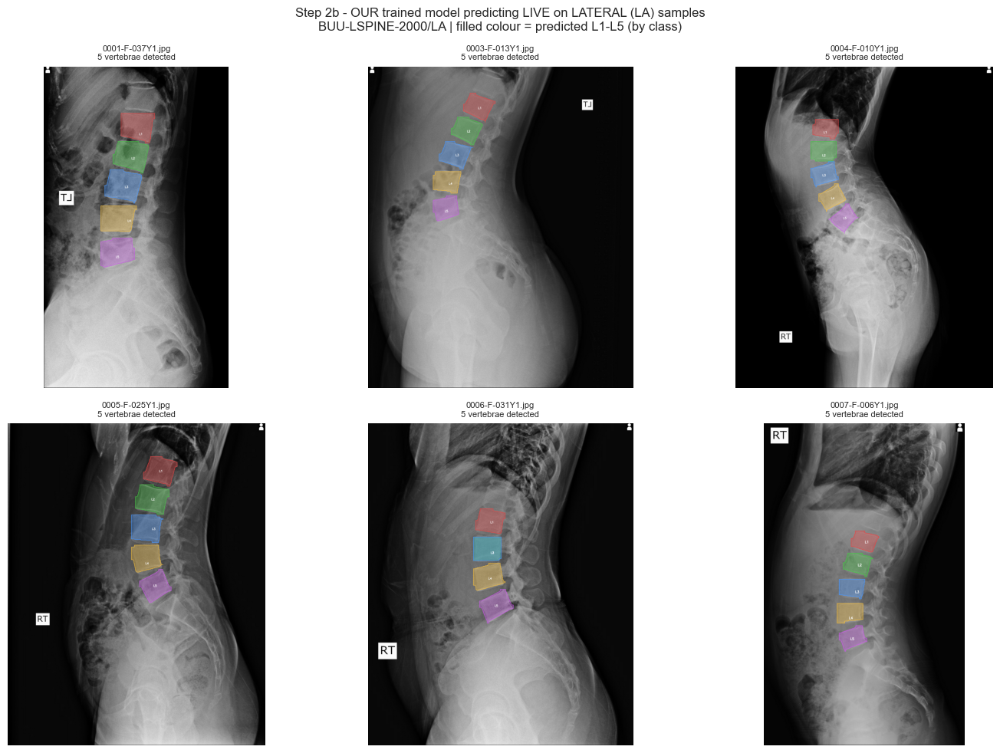

[note] c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\results.csv not found -> learning-curve plot skipped (live metrics above still valid).


In [26]:
# Step 2b rebuilt to be *trustworthy*: instead of only displaying cached PNGs, we (1) compute the
# validation metrics LIVE with seg.val() on the held-out split right now, and (2) run OUR trained
# model LIVE on held-out val images and overlay predictions vs ground-truth. If a results.csv from
# training exists we also parse it and plot the learning curves ourselves.
RUN_DIR   = os.path.join(YOLO_PROJECT, YOLO_NAME)
data_yaml = os.path.join(YOLO_DATA_ROOT, "data.yaml")

# ---- (1) LIVE validation metrics (computed now, not read from a saved image) ----
if os.path.exists(data_yaml):
    print("Running live seg.val() on the held-out BUU val split (computed now) ...")
    vm = seg.val(data=data_yaml, split="val", project=YOLO_PROJECT, name="val_live",
                 exist_ok=True, plots=False, verbose=False)
    live = {"precision": float(vm.seg.mp), "recall": float(vm.seg.mr),
            "mAP@50": float(vm.seg.map50), "mAP@50-95": float(vm.seg.map)}
    fig, ax = plt.subplots(figsize=(6.5, 4))
    bars = ax.bar(list(live), list(live.values()),
                  color=["#4C72B0", "#55A868", "#C44E52", "#8172B3"])
    ax.set_ylim(0, 1.05); ax.set_ylabel("score")
    ax.set_title(f"Step 2b - LIVE mask metrics on val (seg.val, {os.path.basename(YOLO_NAME)})")
    for b, v in zip(bars, live.values()):
        ax.text(b.get_x() + b.get_width()/2, v + 0.02, f"{v:.3f}", ha="center", fontsize=10)
    plt.tight_layout(); savefig(fig, "step2b_live_val_metrics.png"); plt.show()
    print("  live mask metrics:", {k: round(v, 4) for k, v in live.items()})
else:
    print(f"[note] {data_yaml} absent (dataset not rebuilt this session) -> skipping live metrics.")

# ---- (2) LIVE predictions of OUR model on held-out val images vs ground truth ----
val_img_dir = os.path.join(YOLO_DATA_ROOT, "images", "val")
val_lbl_dir = os.path.join(YOLO_DATA_ROOT, "labels", "val")
val_imgs = sorted(glob.glob(os.path.join(val_img_dir, "*")))[:6]
if val_imgs:
    palette = [(230, 70, 70), (70, 200, 70), (70, 150, 255), (245, 190, 60), (200, 90, 230)]
    ncol = 3; nrow = int(np.ceil(len(val_imgs) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow)); axes = np.atleast_1d(axes).ravel()
    for a in axes: a.axis("off")
    for a, ip in zip(axes, val_imgs):
        img = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2RGB); H, W = img.shape[:2]
        r = seg.predict(img, conf=CONF, verbose=False)[0]
        vis = img.copy()
        if r.masks is not None:
            cls = r.boxes.cls.cpu().numpy().astype(int)
            for poly, c in zip(r.masks.xy, cls):
                col = palette[int(c) % len(palette)]
                ov = vis.copy(); cv2.fillPoly(ov, [poly.astype(np.int32)], col)
                vis = cv2.addWeighted(ov, 0.35, vis, 0.65, 0)
                cv2.polylines(vis, [poly.astype(np.int32)], True, col, 2)
                cx, cy = poly.mean(0).astype(int)
                cv2.putText(vis, CLASS_NAMES[int(c)], (cx-14, cy+5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        lp = os.path.join(val_lbl_dir, os.path.splitext(os.path.basename(ip))[0] + ".txt")
        if os.path.exists(lp):
            for line in open(lp):
                v = line.split()
                if len(v) >= 7:
                    pts = (np.array(v[1:], float).reshape(-1, 2) * [W, H]).astype(np.int32)
                    cv2.polylines(vis, [pts], True, (255, 255, 255), 1)
        a.imshow(vis); a.set_title(f"{os.path.basename(ip)[:16]}\n{len(r.boxes)} vertebrae detected", fontsize=8)
    fig.suptitle("Step 2b - OUR trained model predicting LIVE on held-out val images\n"
                 "filled colour = predicted L1-L5 (by class) | thin white = ground-truth polygons",
                 fontsize=12)
    plt.tight_layout(); savefig(fig, "step2b_live_val_predictions.png"); plt.show()
else:
    print(f"[note] no val images in {val_img_dir} (dataset not rebuilt this session).")

# ---- (2-LA) LIVE predictions on 6 LATERAL (LA) samples from BUU-LSPINE-2000/LA ----
la_imgs = buu_by_view.get("LA", [])[:6]
if not la_imgs:                                    # fallback: glob the LA images folder directly
    la_dir = view_dirs("LA")[0]
    la_imgs = [p for p in sorted(glob.glob(os.path.join(la_dir, "*")))
               if os.path.splitext(p)[1].lower() in (".jpg", ".jpeg", ".png")][:6]
if la_imgs:
    palette = [(230, 70, 70), (70, 200, 70), (70, 150, 255), (245, 190, 60), (200, 90, 230)]
    ncol = 3; nrow = int(np.ceil(len(la_imgs) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow)); axes = np.atleast_1d(axes).ravel()
    for a in axes: a.axis("off")
    for a, ip in zip(axes, la_imgs):
        img = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2RGB); H, W = img.shape[:2]
        r = seg.predict(img, conf=CONF, verbose=False)[0]
        vis = img.copy()
        if r.masks is not None:
            cls = r.boxes.cls.cpu().numpy().astype(int)
            for poly, c in zip(r.masks.xy, cls):
                col = palette[int(c) % len(palette)]
                ov = vis.copy(); cv2.fillPoly(ov, [poly.astype(np.int32)], col)
                vis = cv2.addWeighted(ov, 0.35, vis, 0.65, 0)
                cv2.polylines(vis, [poly.astype(np.int32)], True, col, 2)
                cx, cy = poly.mean(0).astype(int)
                cv2.putText(vis, CLASS_NAMES[int(c)], (cx-14, cy+5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        a.imshow(vis); a.set_title(f"{os.path.basename(ip)[:16]}\n{len(r.boxes)} vertebrae detected", fontsize=8)
    fig.suptitle("Step 2b - OUR trained model predicting LIVE on LATERAL (LA) samples\n"
                 "BUU-LSPINE-2000/LA | filled colour = predicted L1-L5 (by class)", fontsize=12)
    plt.tight_layout(); savefig(fig, "step2b_live_la_predictions.png"); plt.show()
else:
    print("[note] no LA images found under BUU-LSPINE-2000/LA -> lateral panel skipped.")

# ---- (3) If a training results.csv exists, plot the learning curves ourselves ----
rc_path = os.path.join(RUN_DIR, "results.csv")
if os.path.exists(rc_path):
    rdf = pd.read_csv(rc_path); rdf.columns = [c.strip() for c in rdf.columns]
    ep = rdf["epoch"]
    fig, ax = plt.subplots(1, 3, figsize=(18, 4.6))
    for col, lab in [("train/seg_loss", "train seg"), ("val/seg_loss", "val seg"),
                     ("train/box_loss", "train box"), ("val/box_loss", "val box")]:
        if col in rdf: ax[0].plot(ep, rdf[col], label=lab)
    ax[0].set_title("Losses"); ax[0].set_xlabel("epoch"); ax[0].legend(); ax[0].grid(alpha=.3)
    for col, lab in [("metrics/mAP50(M)", "mask mAP@50"), ("metrics/mAP50-95(M)", "mask mAP@50-95")]:
        if col in rdf: ax[1].plot(ep, rdf[col], marker=".", label=lab)
    ax[1].set_title("Mask mAP"); ax[1].set_xlabel("epoch"); ax[1].set_ylim(0, 1); ax[1].legend(); ax[1].grid(alpha=.3)
    for col, lab in [("metrics/precision(M)", "precision"), ("metrics/recall(M)", "recall")]:
        if col in rdf: ax[2].plot(ep, rdf[col], marker=".", label=lab)
    ax[2].set_title("Mask precision / recall"); ax[2].set_xlabel("epoch"); ax[2].set_ylim(0, 1)
    ax[2].legend(); ax[2].grid(alpha=.3)
    fig.suptitle(f"Step 2b - training curves parsed from results.csv ({len(rdf)} epochs)", fontsize=13)
    plt.tight_layout(); savefig(fig, "step2b_training_curves.png"); plt.show()
else:
    print(f"[note] {rc_path} not found -> learning-curve plot skipped (live metrics above still valid).")

### L4 extraction & visualization

The trained model detects L1–L5 as instances. The L4 mask is chosen by **class** when available, else
by the **4th-from-top** rule (vertebrae ordered by vertical centroid). A single `yolo_l4()` helper
returns the selected L4 mask, the status, **all** instance masks, and the raw result — every later
step reuses it (no duplicated inference helpers).

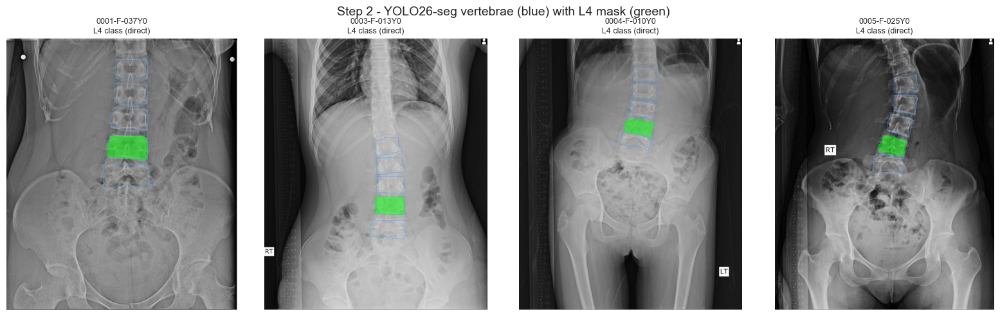

In [27]:
def poly_to_mask(poly_xy, H, W, shrink=1.0):
    poly = np.asarray(poly_xy, np.float32)
    if shrink != 1.0 and len(poly):
        ctr = poly.mean(0); poly = ctr + shrink * (poly - ctr)
    m = np.zeros((H, W), np.uint8)
    if len(poly):
        cv2.fillPoly(m, [poly.astype(np.int32)], 1)
    return m

def pick_l4_index(boxes_xyxy, classes, confs):
    '''Choose the L4 instance: direct class, else 4th vertebra from the top (fallback).'''
    if len(boxes_xyxy) == 0:
        return None, "no detection"
    idx = [i for i, c in enumerate(classes) if c == L4_IDX]
    if idx:
        return max(idx, key=lambda i: confs[i]), "L4 class (direct)"
    order = sorted(range(len(boxes_xyxy)), key=lambda i: (boxes_xyxy[i][1] + boxes_xyxy[i][3]) / 2)
    if len(order) >= 4:
        return order[3], "4th-from-top (fallback)"
    return None, f"only {len(boxes_xyxy)} vertebrae"

def yolo_l4(rgb, conf=CONF, shrink=1.0):
    '''Run YOLO once. Return (l4_mask|None, status, all_instance_masks, result).'''
    r = seg.predict(rgb, conf=conf, verbose=False)[0]
    H, W = rgb.shape[:2]
    if r.masks is None or len(r.boxes) == 0:
        return None, "no detection", [], r
    boxes   = r.boxes.xyxy.cpu().numpy()
    classes = r.boxes.cls.cpu().numpy().astype(int)
    confs   = r.boxes.conf.cpu().numpy()
    inst = [poly_to_mask(r.masks.xy[i], H, W, shrink) for i in range(len(r.masks.xy))]
    i, status = pick_l4_index(boxes, classes, confs)
    return (inst[i] if i is not None else None), status, inst, r

# ---- Visualization: YOLO segmentation with L4 highlighted ----
fig, axes = plt.subplots(1, 4, figsize=(16, 5))
for k, p in enumerate(buu_imgs[:4]):
    rgb, _, H, W = load_xray(p)
    m, status, inst, r = yolo_l4(rgb)
    vis = rgb.copy()
    if r.masks is not None:
        for poly in r.masks.xy:
            cv2.polylines(vis, [poly.astype(np.int32)], True, (80, 160, 255), 2)
    if m is not None:
        vis[m > 0] = (0.5 * vis[m > 0] + 0.5 * np.array([0, 255, 0])).astype(np.uint8)
    axes[k].imshow(vis); axes[k].set_title(f"{os.path.basename(p)[:12]}\n{status}", fontsize=9)
    axes[k].axis("off")
fig.suptitle("Step 2 - YOLO26-seg vertebrae (blue) with L4 mask (green)", fontsize=14)
plt.tight_layout(); savefig(fig, "step2_l4_extraction.png"); plt.show()

## Step 3 — BMD & GLCM Extractors

In [28]:
def shrink_mask(mask, shrink=ROI_SHRINK):
    '''Scale the mask toward its centroid (kept as a robust fallback for trabecular_roi).'''
    if shrink >= 1.0:
        return mask
    ys, xs = np.where(mask > 0)
    if len(xs) == 0:
        return mask
    cx, cy = xs.mean(), ys.mean()
    out = np.zeros_like(mask)
    nx = np.clip((cx + shrink * (xs - cx)).astype(int), 0, mask.shape[1] - 1)
    ny = np.clip((cy + shrink * (ys - cy)).astype(int), 0, mask.shape[0] - 1)
    out[ny, nx] = 1
    return cv2.morphologyEx(out, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8))

def trabecular_roi(mask, erode_frac=0.10, endplate_frac=0.18):
    '''Central *trabecular* ROI: (1) erode away the dense cortical rim, then
       (2) drop the superior & inferior endplate bands (the brightest, most-contaminated
       rows). This removes cortical bone / endplates / projection edges so the intensity
       and texture reflect cancellous bone. Falls back to shrink_mask if degenerate.'''
    m = (mask > 0).astype(np.uint8)
    ys, xs = np.where(m)
    if len(xs) == 0:
        return mask
    y0, y1 = ys.min(), ys.max(); h = y1 - y0 + 1
    k = max(3, int(round(erode_frac * h)))
    er = cv2.erode(m, np.ones((k, k), np.uint8))
    cut = int(round(endplate_frac * h))                  # strip top & bottom endplate bands
    er[:y0 + cut] = 0
    er[y1 - cut + 1:] = 0
    if er.sum() < 10:                                    # too aggressive -> safe fallback
        return shrink_mask(mask)
    return er

def soft_tissue_ref(img_norm, full_mask):
    '''Median intensity of the paraspinal soft-tissue bands just lateral to the vertebra.
       Used as an exposure/device reference for a relative (device-robust) BMD index.
       Sampled left & right at mid-height to avoid endplates and adjacent vertebrae.
       Returns None if a band cannot be sampled.'''
    ys, xs = np.where(full_mask > 0)
    if len(xs) == 0:
        return None
    y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    Hh, Ww = img_norm.shape[:2]
    h, w = y1 - y0 + 1, x1 - x0 + 1
    ym0, ym1 = y0 + h // 4, y1 - h // 4
    gap = max(3, int(0.15 * w)); wid = max(5, int(0.5 * w))
    left  = img_norm[ym0:ym1, max(0, x0 - gap - wid):max(0, x0 - gap)]
    right = img_norm[ym0:ym1, min(Ww, x1 + gap):min(Ww, x1 + gap + wid)]
    ref = np.concatenate([left.ravel(), right.ravel()])
    return float(np.median(ref)) if ref.size else None

def compute_bmd(img_norm, roi_mask, full_mask=None):
    '''Intensity BMD proxy on the ROI.
       - bmd_trimmed : 10-90% trimmed mean (robust to residual endplate/vessel outliers)  <- main index
       - bmd_rel     : device-robust relative index = bmd_trimmed / paraspinal soft-tissue reference
                       (only when full_mask is given). Cancels global exposure/gain differences.'''
    vals = img_norm[roi_mask > 0]
    if vals.size == 0:
        return None
    p10, p90 = np.percentile(vals, 10), np.percentile(vals, 90)
    core = vals[(vals >= p10) & (vals <= p90)]
    trimmed = float(core.mean()) if core.size else float(vals.mean())
    out = {"area_px": int(vals.size), "bmd_mean": float(vals.mean()),
           "bmd_trimmed": trimmed, "bmd_median": float(np.median(vals)),
           "bmd_std": float(vals.std()), "bmd_p10": float(p10), "bmd_p90": float(p90)}
    if full_mask is not None:
        ref = soft_tissue_ref(img_norm, full_mask)
        out["soft_tissue_ref"] = ref
        out["bmd_rel"] = float(trimmed / (ref + 1e-6)) if ref else None
    return out

def compute_glcm(img_norm, mask, levels=GLCM_LEVELS):
    ys, xs = np.where(mask > 0)
    if len(xs) == 0:
        return None
    y0, y1, x0, x1 = ys.min(), ys.max() + 1, xs.min(), xs.max() + 1
    roi  = (img_norm[y0:y1, x0:x1] * (levels - 1)).astype(np.uint8)
    mroi = mask[y0:y1, x0:x1]
    roi[mroi == 0] = 0
    glcm = graycomatrix(roi, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=levels, symmetric=True, normed=True)
    return {"glcm_contrast": float(graycoprops(glcm, "contrast").mean()),
            "glcm_correlation": float(graycoprops(glcm, "correlation").mean()),
            "glcm_energy": float(graycoprops(glcm, "energy").mean()),
            "glcm_homogeneity": float(graycoprops(glcm, "homogeneity").mean())}

def load_test_gt_l4(dcm_path, H, W):
    '''Binary L4 ground-truth mask (PNG) resized to (H, W).'''
    stem = os.path.splitext(os.path.basename(dcm_path))[0]
    p = os.path.join(TEST_MASK_DIR, stem + ".png")
    if not os.path.exists(p):
        return None
    fg = (cv2.imread(p).sum(axis=2) > 10).astype(np.uint8)
    return cv2.resize(fg, (W, H), interpolation=cv2.INTER_NEAREST)

# ---- v14: per-vertebra masks + clinical L1~L4 averaged trabecular BMD ----
def vertebra_masks(rgb, conf=CONF):
    '''{cls_id: best (highest-conf) instance mask} for each detected L1..L5 (via seg.predict).'''
    r = seg.predict(rgb, conf=conf, verbose=False)[0]
    H, W = rgb.shape[:2]
    out = {}
    if r.masks is None or len(r.boxes) == 0:
        return out
    classes = r.boxes.cls.cpu().numpy().astype(int)
    confs   = r.boxes.conf.cpu().numpy()
    for c in range(len(CLASS_NAMES)):
        idx = [i for i in range(len(classes)) if classes[i] == c]
        if not idx:
            continue
        best = max(idx, key=lambda i: confs[i])
        out[c] = poly_to_mask(r.masks.xy[best], H, W)
    return out

def compute_spine_bmd(gray_lin, rgb, levels=(0, 1, 2, 3), masks=None):
    '''Per-vertebra trabecular BMD for L1..L4 + their mean (clinical DXA lumbar convention:
       lumbar BMD = L1-L4 average). Returns a flat dict with per-vertebra bmd_<name>,
       bmd_rel_<name>, and bmd_L1L4_mean / bmd_rel_L1L4_mean / n_vert.'''
    if masks is None:
        masks = vertebra_masks(rgb)
    rec, tr, rl = {}, [], []
    for c in levels:
        name = CLASS_NAMES[c]
        m = masks.get(c)
        b = compute_bmd(gray_lin, trabecular_roi(m), full_mask=m) if (m is not None and m.sum()) else None
        if b is None:
            rec[f"bmd_{name}"] = None; rec[f"bmd_rel_{name}"] = None
            continue
        rec[f"bmd_{name}"] = b["bmd_trimmed"]; rec[f"bmd_rel_{name}"] = b.get("bmd_rel")
        tr.append(b["bmd_trimmed"])
        if b.get("bmd_rel") is not None:
            rl.append(b["bmd_rel"])
    rec["n_vert"] = len(tr)
    rec["bmd_L1L4_mean"]     = float(np.mean(tr)) if tr else None
    rec["bmd_rel_L1L4_mean"] = float(np.mean(rl)) if rl else None
    return rec

print("Helpers ready (trabecular_roi + soft-tissue-relative BMD + trimmed mean + L1~L4 spine BMD).")

Helpers ready (trabecular_roi + soft-tissue-relative BMD + trimmed mean + L1~L4 spine BMD).


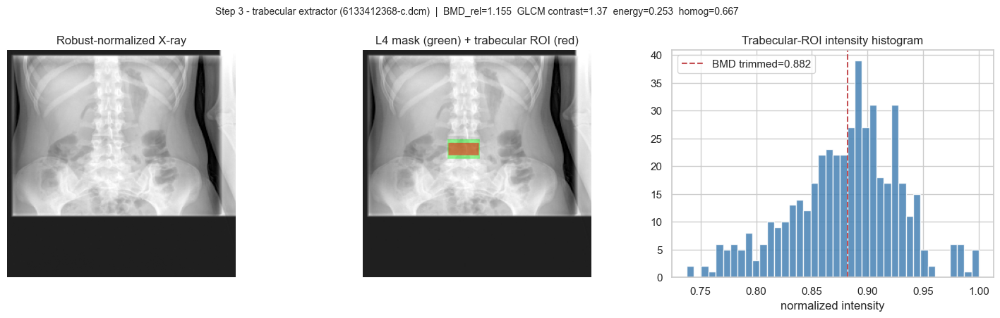

In [29]:
# ---- Step 3 demo - eye-check the trabecular-ROI BMD/GLCM extractor on one detected L4 ----
if eval_items:
    _p = eval_items[0]
    _rgb, _gl, _H, _W = load_xray(_p)
    _m, _st, _inst, _r = yolo_l4(_rgb)
    if _m is not None and _m.sum():
        _roi  = trabecular_roi(_m)                       # v13: eroded + endplates removed
        _bmd  = compute_bmd(_gl, _roi, full_mask=_m)     # + soft-tissue-relative index
        _glcm = compute_glcm(_gl, _roi)
        _vis = cv2.cvtColor((_gl * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
        _vis[_m   > 0] = (0.6 * _vis[_m   > 0] + 0.4 * np.array([0, 255, 0])).astype(np.uint8)
        _vis[_roi > 0] = (0.5 * _vis[_roi > 0] + 0.5 * np.array([255, 0, 0])).astype(np.uint8)
        _rel = f"{_bmd['bmd_rel']:.3f}" if _bmd.get('bmd_rel') is not None else "n/a"
        fig, ax = plt.subplots(1, 3, figsize=(15, 4.6))
        ax[0].imshow(_gl, cmap="gray"); ax[0].set_title("Robust-normalized X-ray"); ax[0].axis("off")
        ax[1].imshow(_vis); ax[1].set_title("L4 mask (green) + trabecular ROI (red)"); ax[1].axis("off")
        ax[2].hist(_gl[_roi > 0].ravel(), bins=40, color="steelblue", alpha=0.85)
        ax[2].axvline(_bmd["bmd_trimmed"], color="r", ls="--", label=f"BMD trimmed={_bmd['bmd_trimmed']:.3f}")
        ax[2].set_title("Trabecular-ROI intensity histogram"); ax[2].set_xlabel("normalized intensity"); ax[2].legend()
        fig.suptitle(f"Step 3 - trabecular extractor ({os.path.basename(_p)[-16:]})  |  "
                     f"BMD_rel={_rel}  GLCM contrast={_glcm['glcm_contrast']:.2f}  "
                     f"energy={_glcm['glcm_energy']:.3f}  homog={_glcm['glcm_homogeneity']:.3f}", fontsize=10)
        plt.tight_layout(); savefig(fig, "step3_extractor_sanity.png"); plt.show()
    else:
        print("No L4 detected on the demo image; skipping Step 3 sanity plot.")
else:
    print("No eval_items available for the Step 3 demo.")

## Step 4 — Evaluation on the DICOM Test Set

Evaluated on `dataset-dcm/test/gather` against the **L4 ground-truth masks**, reported **two ways**:

- **(A) Deployed** — Dice / IoU / Precision / Recall of the mask the pipeline actually *names* `L4`
  (the honest real-world inference number; no ground truth used to pick the vertebra).
- **(B) Matched** — Dice of the *best-overlap* detected vertebra vs the GT L4 (isolates segmentation
  quality from *which* vertebra is labelled L4).

A large **(B − A) gap** is the signature of an **L4 naming / indexing** problem on the out-of-domain
DICOM field-of-view — **not** poor segmentation. Metrics CSV → `metrics/`, figures → `figures/`.

In [30]:
def seg_scores(pred, gt, eps=1e-6):
    pred = pred.astype(bool); gt = gt.astype(bool)
    tp = np.logical_and(pred, gt).sum()
    fp = np.logical_and(pred, ~gt).sum()
    fn = np.logical_and(~pred, gt).sum()
    dice = 2*tp / (2*tp + fp + fn + eps)
    iou  = tp / (tp + fp + fn + eps)
    prec = tp / (tp + fp + eps)
    rec  = tp / (tp + fn + eps)
    return dice, iou, prec, rec, int(tp), int(fp), int(fn)

def best_overlap(inst, gt):
    '''Among ALL detected vertebra instances, the one with the highest Dice vs GT.'''
    if not inst:
        return np.zeros_like(gt), 0.0
    d, m = max(((seg_scores(m, gt)[0], m) for m in inst), key=lambda t: t[0])
    return m, d

# ---- Dual-metric evaluation: (A) Deployed (named L4) vs (B) Matched (best-overlap) ----
rows, bmd_pred, bmd_gt = [], [], []
cm_total = np.zeros((2, 2), dtype=np.int64)
n_fail = 0
for dp in eval_items:
    rgb, gray_lin, H, W = load_xray(dp)
    sel, status, inst, r = yolo_l4(rgb)
    gt = load_test_gt_l4(dp, H, W)
    if gt is None:
        continue
    if sel is None:
        sel = np.zeros((H, W), np.uint8); n_fail += 1
    d, i, p, rc, tp, fp, fn = seg_scores(sel, gt)            # (A) DEPLOYED
    bo_mask, d_match = best_overlap(inst, gt)               # (B) MATCHED
    tn = H*W - (tp + fp + fn)
    cm_total += np.array([[tn, fp], [fn, tp]], dtype=np.int64)
    rows.append({"file": os.path.basename(dp), "status": status, "n_inst": len(inst),
                 "dice": d, "iou": i, "precision": p, "recall": rc, "dice_matched": d_match})
    bp = compute_bmd(gray_lin, trabecular_roi(sel), full_mask=sel) if sel.sum() else None
    bg = compute_bmd(gray_lin, trabecular_roi(gt), full_mask=gt)
    if bp and bg:
        bmd_pred.append(bp["bmd_trimmed"]); bmd_gt.append(bg["bmd_trimmed"])

dfm = pd.DataFrame(rows)
print(f"Evaluated {len(dfm)} test images | L4 detection failures: {n_fail}\n")
print("=== (A) DEPLOYED - mask the model names 'L4'  (honest real-world inference) ===")
for c in ["dice", "iou", "precision", "recall"]:
    print(f"  {c.capitalize():10s}: {dfm[c].mean():.4f} +/- {dfm[c].std():.4f}")
print("\n=== (B) MATCHED - best-overlap vertebra vs GT  (segmentation quality, naming aside) ===")
print(f"  Dice      : {dfm['dice_matched'].mean():.4f} +/- {dfm['dice_matched'].std():.4f}")

n_zero = int((dfm['dice'] < 0.05).sum())
gap = dfm['dice_matched'].mean() - dfm['dice'].mean()
print(f"\n>> Indexing gap (Matched - Deployed Dice) = {gap:.4f}")
print(f">> {n_zero}/{len(dfm)} images have Deployed Dice ~ 0, yet best-overlap reaches mean Dice = "
      f"{dfm.loc[dfm['dice']<0.05, 'dice_matched'].mean():.3f} on those same images.")
dfm.to_csv(os.path.join(METRICS_DIR, "L4_test_segmetrics.csv"), index=False)
print("Saved ->", os.path.join(METRICS_DIR, "L4_test_segmetrics.csv"))

Evaluated 42 test images | L4 detection failures: 3

=== (A) DEPLOYED - mask the model names 'L4'  (honest real-world inference) ===
  Dice      : 0.3024 +/- 0.4166
  Iou       : 0.2677 +/- 0.3750
  Precision : 0.2963 +/- 0.4109
  Recall    : 0.3110 +/- 0.4274

=== (B) MATCHED - best-overlap vertebra vs GT  (segmentation quality, naming aside) ===
  Dice      : 0.7569 +/- 0.2128

>> Indexing gap (Matched - Deployed Dice) = 0.4545
>> 27/42 images have Deployed Dice ~ 0, yet best-overlap reaches mean Dice = 0.707 on those same images.
Saved -> ./l4_v7_output\metrics\L4_test_segmetrics.csv


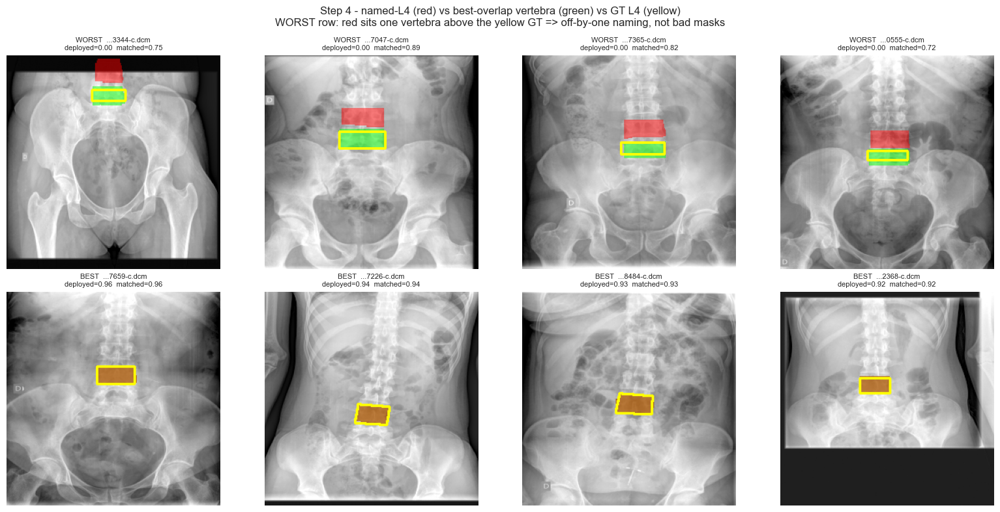

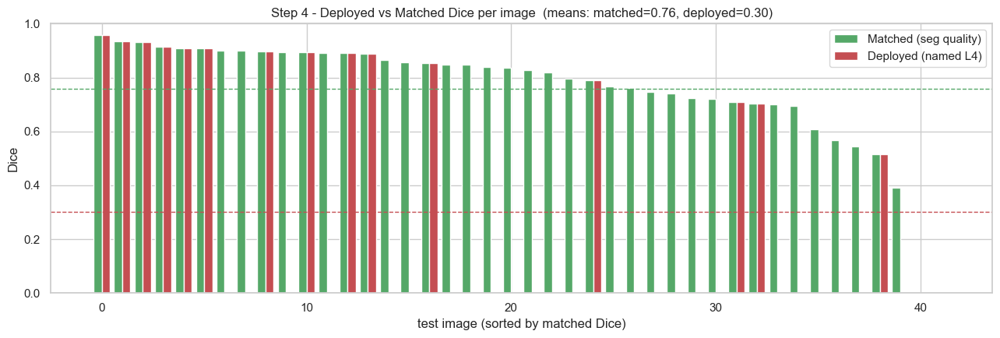

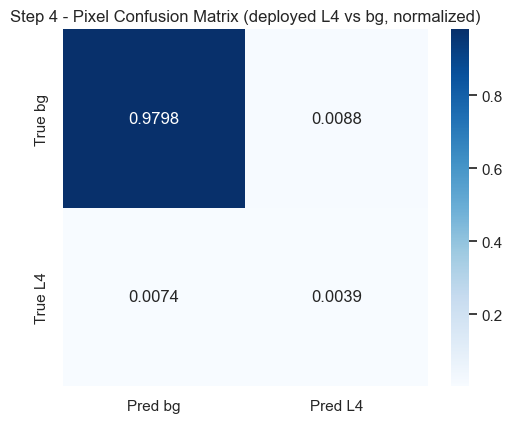

In [31]:
# ---- (1) Diagnostic overlays: where does the 'L4' name land vs the true L4? ----
# red = named 'L4' (deployed)   green = best-overlap vertebra (matched)   yellow = GT L4 contour
worst = dfm.sort_values("dice").head(4)["file"].tolist()
best  = dfm.sort_values("dice", ascending=False).head(4)["file"].tolist()
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for k, fname in enumerate(worst + best):
    dp = next(p for p in eval_items if os.path.basename(p) == fname)
    rgb, _, H, W = load_xray(dp)
    sel, status, inst, r = yolo_l4(rgb)
    gt = load_test_gt_l4(dp, H, W)
    bo_mask, d_match = best_overlap(inst, gt)
    vis = rgb.copy()
    if bo_mask is not None and bo_mask.sum():
        vis[bo_mask > 0] = (0.5*vis[bo_mask > 0] + 0.5*np.array([0, 255, 0])).astype(np.uint8)
    if sel is not None and sel.sum():
        vis[sel > 0]     = (0.5*vis[sel > 0]     + 0.5*np.array([255, 0, 0])).astype(np.uint8)
    if gt is not None:
        cnts, _ = cv2.findContours(gt, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(vis, cnts, -1, (255, 255, 0), 2)
    row = dfm[dfm.file == fname].iloc[0]
    ax = axes[k//4, k % 4]
    ax.imshow(vis); ax.axis("off")
    ax.set_title(f"{'WORST' if k < 4 else 'BEST'}  ...{fname[-10:]}\n"
                 f"deployed={row['dice']:.2f}  matched={row['dice_matched']:.2f}", fontsize=8)
fig.suptitle("Step 4 - named-L4 (red) vs best-overlap vertebra (green) vs GT L4 (yellow)\n"
             "WORST row: red sits one vertebra above the yellow GT => off-by-one naming, not bad masks",
             fontsize=12)
plt.tight_layout(); savefig(fig, "step4_overlays.png"); plt.show()

# ---- (2) Per-image Deployed vs Matched Dice ----
order = dfm.sort_values("dice_matched", ascending=False).reset_index(drop=True)
x = np.arange(len(order))
fig, ax = plt.subplots(figsize=(13, 4.5))
ax.bar(x - 0.2, order["dice_matched"], width=0.4, label="Matched (seg quality)", color="#55A868")
ax.bar(x + 0.2, order["dice"],         width=0.4, label="Deployed (named L4)",   color="#C44E52")
ax.axhline(order["dice_matched"].mean(), color="#55A868", ls="--", lw=1)
ax.axhline(order["dice"].mean(),         color="#C44E52", ls="--", lw=1)
ax.set_xlabel("test image (sorted by matched Dice)"); ax.set_ylabel("Dice"); ax.set_ylim(0, 1)
ax.set_title(f"Step 4 - Deployed vs Matched Dice per image  "
             f"(means: matched={order['dice_matched'].mean():.2f}, deployed={order['dice'].mean():.2f})")
ax.legend(); plt.tight_layout(); savefig(fig, "step4_deployed_vs_matched.png"); plt.show()

# ---- (3) Pixel confusion matrix (deployed L4 vs background) ----
fig, ax = plt.subplots(figsize=(5.2, 4.4))
sns.heatmap(cm_total / cm_total.sum(), annot=True, fmt=".4f", cmap="Blues",
            xticklabels=["Pred bg", "Pred L4"], yticklabels=["True bg", "True L4"], ax=ax)
ax.set_title("Step 4 - Pixel Confusion Matrix (deployed L4 vs bg, normalized)")
plt.tight_layout(); savefig(fig, "step4_confusion_matrix.png"); plt.show()

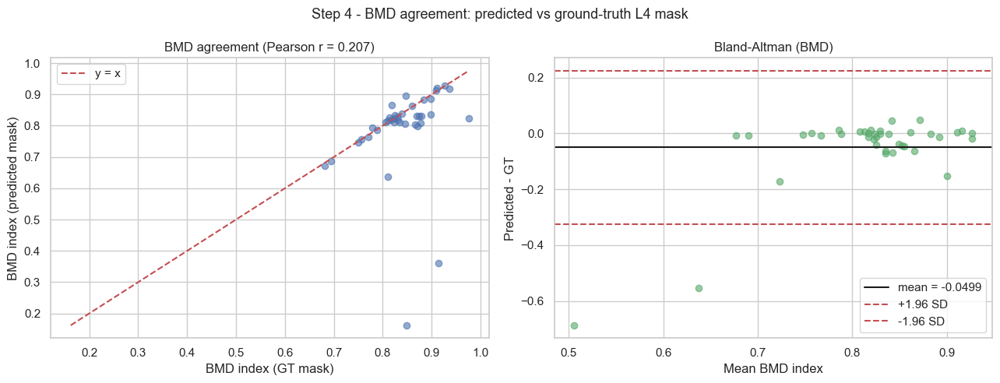

In [32]:
# ---- Bland-Altman + correlation of BMD (predicted vs GT mask) ----
bmd_pred = np.array(bmd_pred); bmd_gt = np.array(bmd_gt)
if len(bmd_gt) >= 2:
    fig, ax = plt.subplots(1, 2, figsize=(13, 5))
    ax[0].scatter(bmd_gt, bmd_pred, alpha=0.6, color="#4C72B0")
    lims = [min(bmd_gt.min(), bmd_pred.min()), max(bmd_gt.max(), bmd_pred.max())]
    ax[0].plot(lims, lims, "r--", label="y = x")
    r = np.corrcoef(bmd_gt, bmd_pred)[0, 1]
    ax[0].set_title(f"BMD agreement (Pearson r = {r:.3f})")
    ax[0].set_xlabel("BMD index (GT mask)"); ax[0].set_ylabel("BMD index (predicted mask)"); ax[0].legend()
    mean_b = (bmd_pred + bmd_gt) / 2.0; diff_b = bmd_pred - bmd_gt
    mdv, sdv = diff_b.mean(), diff_b.std()
    ax[1].scatter(mean_b, diff_b, alpha=0.6, color="#55A868")
    ax[1].axhline(mdv, color="k", label=f"mean = {mdv:.4f}")
    ax[1].axhline(mdv + 1.96*sdv, color="r", ls="--", label="+1.96 SD")
    ax[1].axhline(mdv - 1.96*sdv, color="r", ls="--", label="-1.96 SD")
    ax[1].set_xlabel("Mean BMD index"); ax[1].set_ylabel("Predicted - GT")
    ax[1].set_title("Bland-Altman (BMD)"); ax[1].legend()
    fig.suptitle("Step 4 - BMD agreement: predicted vs ground-truth L4 mask", fontsize=13)
    plt.tight_layout(); savefig(fig, "step4_bland_altman.png"); plt.show()
else:
    print("Not enough paired BMD samples for a Bland-Altman plot.")

## Step 5 — Modular Inference (pre-trained model)

`infer_l4(path)` accepts any raw X-ray (**JPG/PNG or DICOM**), runs YOLO segmentation, and returns +
plots the **L4 BMD and GLCM** metrics. Per-sample figures saved to `figures/step5_*`.

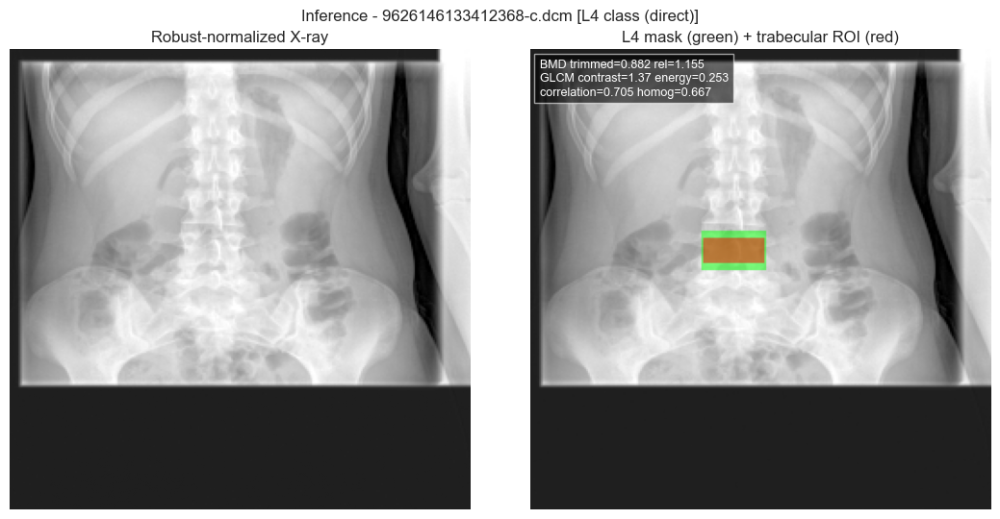

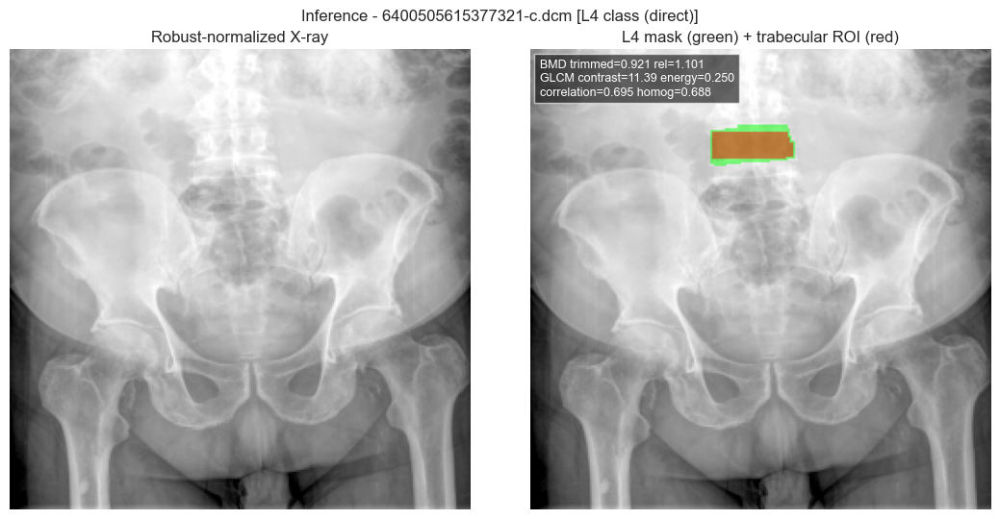

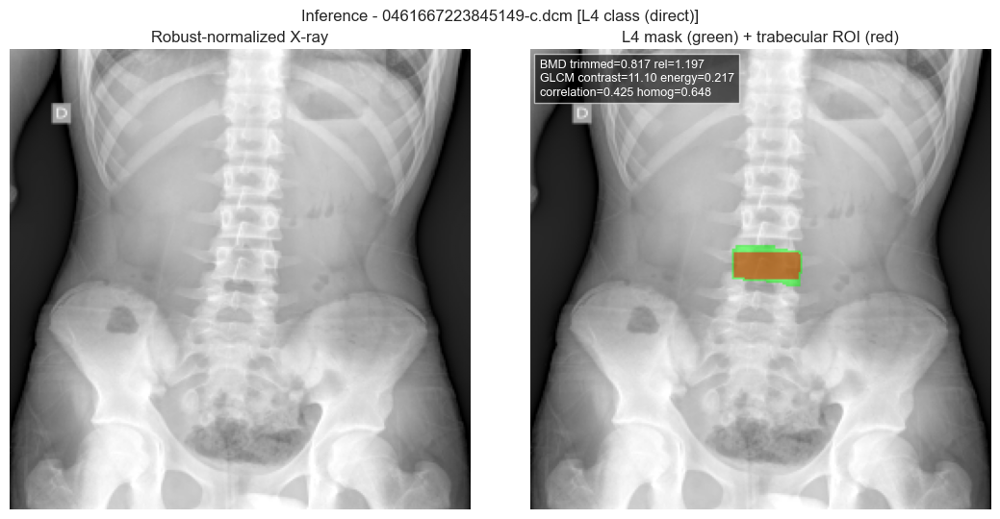

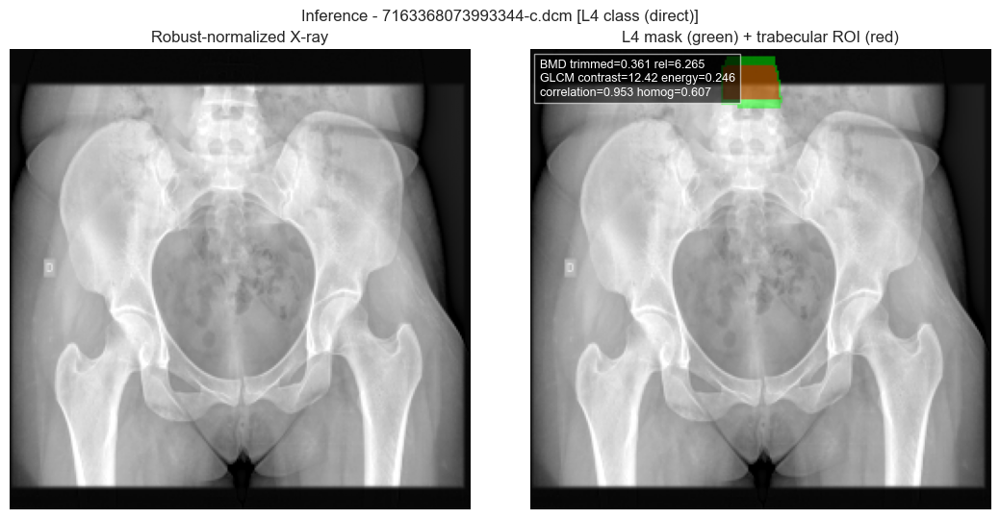

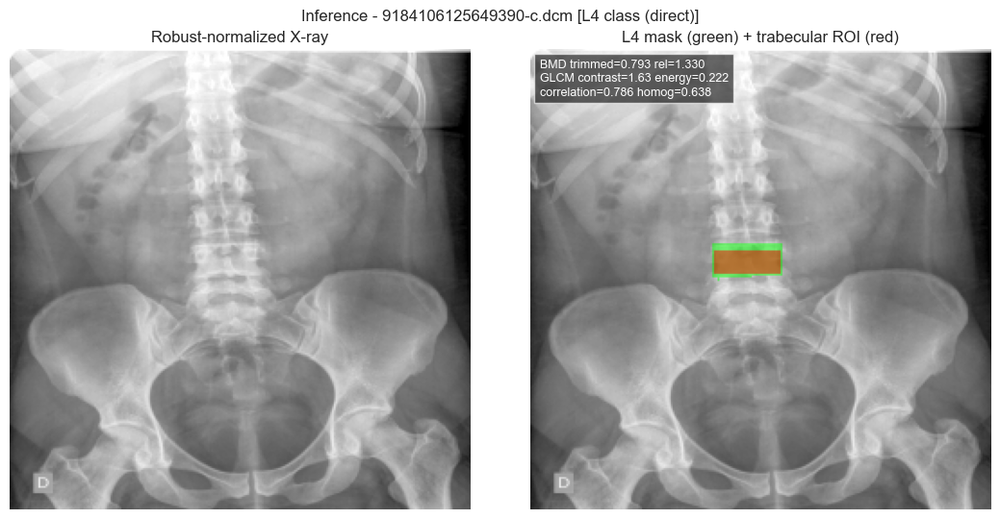

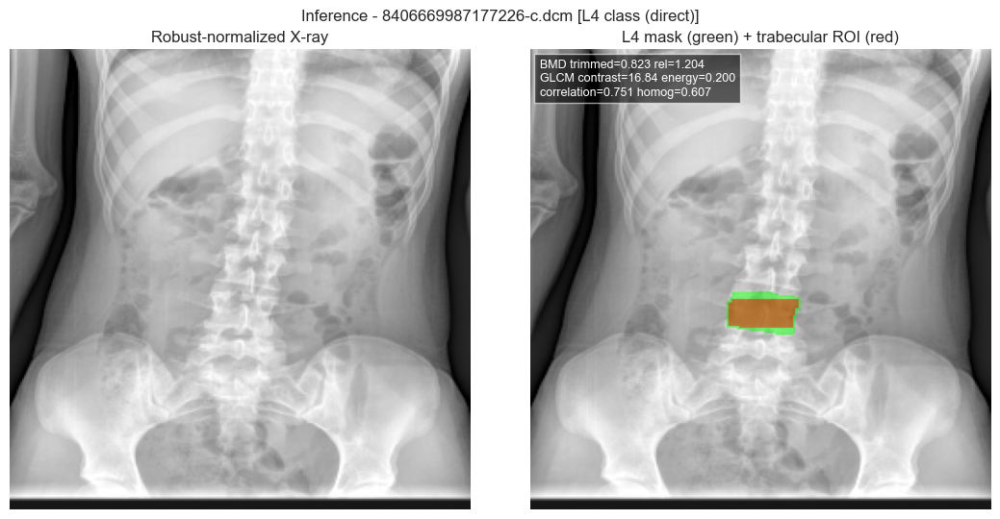

Saved metrics for 42 images -> ./l4_v7_output\metrics\L4_test_metrics.csv


,file,status,area_px,bmd_mean,bmd_trimmed,bmd_median,bmd_std,bmd_p10,bmd_p90,soft_tissue_ref,bmd_rel,glcm_contrast,glcm_correlation,glcm_energy,glcm_homogeneity
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,L4 class (direct),476.0,0.880362,0.882339,0.886292,0.049360,0.814377,0.937204,0.764212,1.154572,1.372916,0.705387,0.253130,0.667040
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,L4 class (direct),656.0,0.918626,0.920837,0.922118,0.047611,0.853777,0.977441,0.836378,1.100980,11.391414,0.695272,0.249516,0.688198
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,L4 class (direct),544.0,0.815014,0.816705,0.818703,0.056434,0.736035,0.885105,0.682530,1.196583,11.104817,0.424659,0.217434,0.647783
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,L4 class (direct),574.0,0.382631,0.361196,0.091736,0.374965,0.029550,0.884471,0.057656,6.264534,12.417104,0.953296,0.245939,0.607304
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,L4 class (direct),481.0,0.786357,0.792571,0.798334,0.065776,0.684311,0.861681,0.595921,1.329990,1.629722,0.785848,0.222434,0.638178
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,L4 class (direct),585.0,0.818637,0.822908,0.826759,0.068662,0.712611,0.895924,0.683329,1.204261,16.842400,0.751126,0.199652,0.607209
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,L4 class (direct),530.0,0.822555,0.825363,0.832852,0.074283,0.714377,0.915633,0.703138,1.173825,8.937027,0.770210,0.176865,0.628110
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,L4 class (direct),476.0,0.757058,0.756871,0.752789,0.073197,0.663646,0.855910,0.662385,1.142643,5.860077,0.599159,0.165058,0.552009
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,only 1 vertebrae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,L4 class (direct),466.0,0.851821,0.862935,0.869798,0.095909,0.708082,0.959671,0.654073,1.319324,3.797046,0.811855,0.158354,0.557055


In [33]:
def infer_l4(path, show=True, savename=None):
    rgb, gray_lin, H, W = load_xray(path)
    m, status, inst, r = yolo_l4(rgb)
    metrics = {"file": os.path.basename(path), "status": status}
    if m is None or m.sum() == 0:
        if show:
            fig = plt.figure(figsize=(5, 5)); plt.imshow(rgb)
            plt.title(f"{status} (no L4)"); plt.axis("off")
            if savename: savefig(fig, savename)
            plt.show()
        return metrics
    roi = trabecular_roi(m)
    bmd = compute_bmd(gray_lin, roi, full_mask=m); glcm = compute_glcm(gray_lin, roi)
    if bmd:  metrics.update(bmd)
    if glcm: metrics.update(glcm)
    if show:
        vis = rgb.copy()
        vis[m > 0]   = (0.5*vis[m > 0]   + 0.5*np.array([0, 255, 0])).astype(np.uint8)
        vis[roi > 0] = (0.5*vis[roi > 0] + 0.5*np.array([255, 0, 0])).astype(np.uint8)
        fig, ax = plt.subplots(1, 2, figsize=(11, 5.5))
        ax[0].imshow(gray_lin, cmap="gray"); ax[0].set_title("Robust-normalized X-ray"); ax[0].axis("off")
        ax[1].imshow(vis); ax[1].axis("off"); ax[1].set_title("L4 mask (green) + trabecular ROI (red)")
        if bmd and glcm:
            txt = (f"BMD trimmed={bmd['bmd_trimmed']:.3f} rel={('%.3f'%bmd['bmd_rel']) if bmd.get('bmd_rel') is not None else 'n/a'}\n"
                   f"GLCM contrast={glcm['glcm_contrast']:.2f} energy={glcm['glcm_energy']:.3f}\n"
                   f"correlation={glcm['glcm_correlation']:.3f} homog={glcm['glcm_homogeneity']:.3f}")
            ax[1].text(0.02, 0.98, txt, transform=ax[1].transAxes, va="top", fontsize=9,
                       color="white", bbox=dict(facecolor="black", alpha=0.6))
        fig.suptitle(f"Inference - {os.path.basename(path)[-22:]} [{status}]", fontsize=12)
        plt.tight_layout()
        if savename: savefig(fig, savename)
        plt.show()
    return metrics

results = [infer_l4(p, show=(k < 6), savename=f"step5_infer_{k:02d}.png" if k < 6 else None)
           for k, p in enumerate(eval_items)]
res_df = pd.DataFrame(results)
res_df.to_csv(os.path.join(METRICS_DIR, "L4_test_metrics.csv"), index=False)
print(f"Saved metrics for {len(res_df)} images -> {os.path.join(METRICS_DIR, 'L4_test_metrics.csv')}")
display(res_df.head(10))

## Step 6 — Save Spine/L4 Extraction Results for the Test Set

Every DICOM test image is processed and its extraction artifacts are written to
`l4_v6_output/segmentation/`:
- `<id>_overlay.png` — all detected vertebrae (blue) with the L4 mask (green),
- `<id>_L4mask.png` — the binary L4 mask,
- `L4_extraction_summary.csv` — per-image status + BMD + GLCM metrics.

A gallery of the first saved overlays is shown for a quick visual check.

Saved 42 results to ./l4_v7_output\segmentation (overlays + masks + summary CSV); L4 found in 39/42.


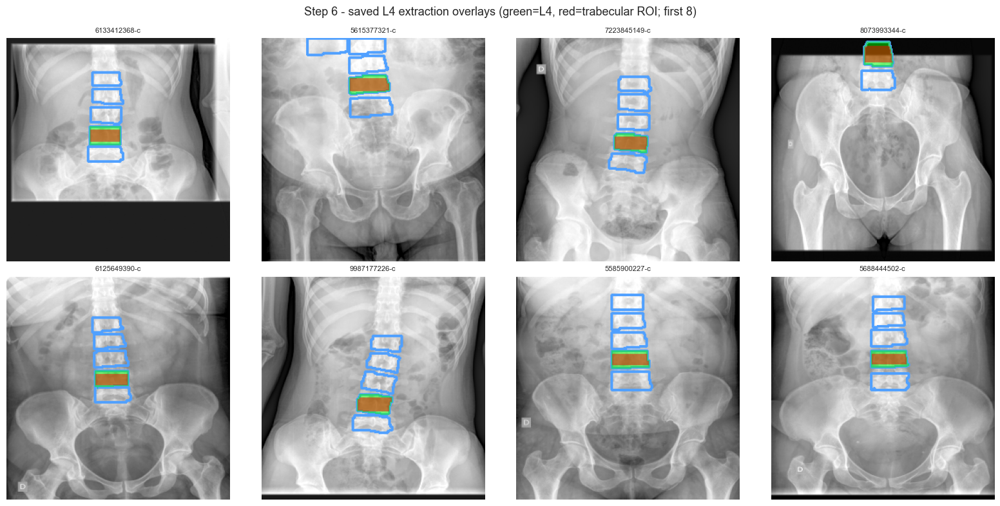

,file,status,area_px,bmd_mean,bmd_trimmed,bmd_median,bmd_std,bmd_p10,bmd_p90,soft_tissue_ref,bmd_rel,glcm_contrast,glcm_correlation,glcm_energy,glcm_homogeneity
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,L4 class (direct),476.0,0.880362,0.882339,0.886292,0.049360,0.814377,0.937204,0.764212,1.154572,1.372916,0.705387,0.253130,0.667040
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,L4 class (direct),656.0,0.918626,0.920837,0.922118,0.047611,0.853777,0.977441,0.836378,1.100980,11.391414,0.695272,0.249516,0.688198
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,L4 class (direct),544.0,0.815014,0.816705,0.818703,0.056434,0.736035,0.885105,0.682530,1.196583,11.104817,0.424659,0.217434,0.647783
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,L4 class (direct),574.0,0.382631,0.361196,0.091736,0.374965,0.029550,0.884471,0.057656,6.264534,12.417104,0.953296,0.245939,0.607304
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,L4 class (direct),481.0,0.786357,0.792571,0.798334,0.065776,0.684311,0.861681,0.595921,1.329990,1.629722,0.785848,0.222434,0.638178
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,L4 class (direct),585.0,0.818637,0.822908,0.826759,0.068662,0.712611,0.895924,0.683329,1.204261,16.842400,0.751126,0.199652,0.607209
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,L4 class (direct),530.0,0.822555,0.825363,0.832852,0.074283,0.714377,0.915633,0.703138,1.173825,8.937027,0.770210,0.176865,0.628110
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,L4 class (direct),476.0,0.757058,0.756871,0.752789,0.073197,0.663646,0.855910,0.662385,1.142643,5.860077,0.599159,0.165058,0.552009
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,only 1 vertebrae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,L4 class (direct),466.0,0.851821,0.862935,0.869798,0.095909,0.708082,0.959671,0.654073,1.319324,3.797046,0.811855,0.158354,0.557055


In [34]:
save_rows, gallery = [], []
for dp in test_dcm_files:
    stem = os.path.splitext(os.path.basename(dp))[0]
    rgb, gray_lin, H, W = load_xray(dp)
    m, status, inst, r = yolo_l4(rgb)
    rec = {"file": os.path.basename(dp), "status": status}
    if m is not None and m.sum() > 0:
        roi  = trabecular_roi(m)                              # v13: trabecular ROI (cortex+endplates removed)
        bmd  = compute_bmd(gray_lin, roi, full_mask=m); glcm = compute_glcm(gray_lin, roi)
        if bmd:  rec.update(bmd)
        if glcm: rec.update(glcm)
        vis = rgb.copy()
        if r.masks is not None:
            for poly in r.masks.xy:
                cv2.polylines(vis, [poly.astype(np.int32)], True, (80, 160, 255), 2)
        vis[m > 0] = (0.5*vis[m > 0] + 0.5*np.array([0, 255, 0])).astype(np.uint8)
        vis[roi > 0] = (0.5*vis[roi > 0] + 0.5*np.array([255, 0, 0])).astype(np.uint8)
        cv2.imwrite(os.path.join(SEG_DIR, stem + "_overlay.png"), cv2.cvtColor(vis, cv2.COLOR_RGB2BGR))
        cv2.imwrite(os.path.join(SEG_DIR, stem + "_L4mask.png"), (m * 255).astype(np.uint8))
        if len(gallery) < 8:
            gallery.append((stem, vis))
    save_rows.append(rec)

summary = pd.DataFrame(save_rows)
summary.to_csv(os.path.join(SEG_DIR, "L4_extraction_summary.csv"), index=False)
n_ok = int(summary["status"].astype(str).str.contains("L4|4th").sum())
print(f"Saved {len(summary)} results to {SEG_DIR} (overlays + masks + summary CSV); "
      f"L4 found in {n_ok}/{len(summary)}.")

# ---- Gallery visualization of the saved overlays ----
if gallery:
    ncol = 4; nrow = int(np.ceil(len(gallery) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(4*ncol, 4*nrow))
    axes = np.atleast_1d(axes).ravel()
    for a in axes: a.axis("off")
    for a, (stem, vis) in zip(axes, gallery):
        a.imshow(vis); a.set_title(stem[-12:], fontsize=8); a.axis("off")
    fig.suptitle("Step 6 - saved L4 extraction overlays (green=L4, red=trabecular ROI; first 8)", fontsize=13)
    plt.tight_layout(); savefig(fig, "step6_extraction_gallery.png"); plt.show()
display(summary.head(10))

## Step 6b - L1~L4 averaged spine BMD (clinical DXA convention)

Clinical lumbar DXA reports BMD as the **L1-L4 average**. We already segment L1~L5, so we compute each vertebra's trabecular BMD (trimmed + soft-tissue-relative) and their L1-L4 mean, and save the per-vertebra values to a CSV.

Saved L1~L4 spine BMD for 42 images -> ./l4_v7_output\metrics\L1L4_spine_bmd.csv  (26/42 with all 4 vertebrae detected).


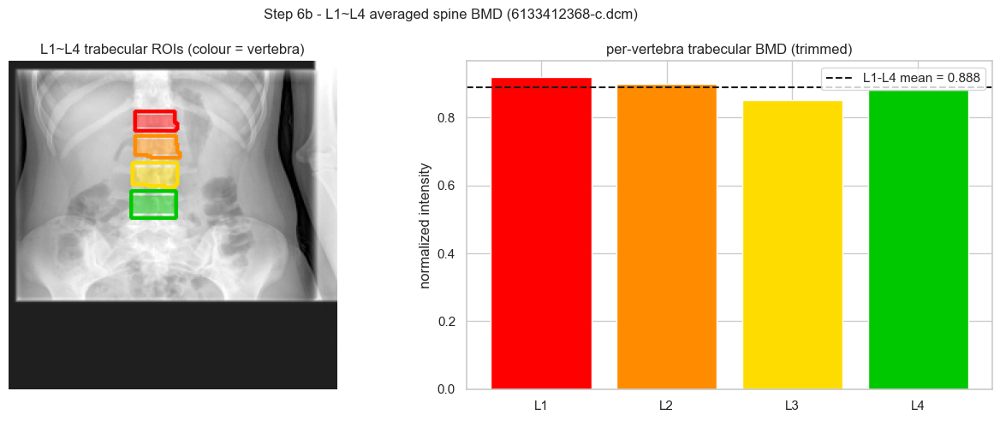

,file,bmd_L1,bmd_rel_L1,bmd_L2,bmd_rel_L2,bmd_L3,bmd_rel_L3,bmd_L4,bmd_rel_L4,n_vert,bmd_L1L4_mean,bmd_rel_L1L4_mean
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,0.919612,1.179170,0.899358,1.145560,0.851294,1.102960,0.882339,1.154572,4,0.888151,1.145566
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,NaN,NaN,0.966673,1.098087,0.970400,1.077438,0.920837,1.100980,3,0.952637,1.092168
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,0.865238,1.134336,0.850826,1.108806,0.842922,1.139330,0.816705,1.196583,4,0.843923,1.144764
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,NaN,NaN,NaN,NaN,NaN,NaN,0.361196,6.264534,1,0.361196,6.264534
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,0.812911,1.190644,0.785398,1.183433,0.730823,1.221438,0.792571,1.329990,4,0.780426,1.231376
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,0.829217,1.148106,0.841826,1.166768,0.802467,1.127630,0.822908,1.204261,4,0.824104,1.161691
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,0.948357,1.095537,0.886156,1.157000,0.866027,1.128919,0.825363,1.173825,4,0.881476,1.138820
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,0.913437,1.228045,0.924873,1.237510,0.867695,1.131175,0.756871,1.142643,4,0.865719,1.184843
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,0.953224,1.167195,0.943765,1.157474,0.917451,1.096290,0.862935,1.319324,4,0.919344,1.185071


In [35]:
# ---- Step 6b - clinical-style L1~L4 averaged trabecular BMD  ->  CSV ----
# DXA lumbar BMD is conventionally the L1-L4 (or L2-L4) average. We already segment L1~L5,
# so we compute each vertebra's trabecular BMD (trimmed + soft-tissue-relative) and their
# L1-L4 mean, then save everything to a CSV.
spine_rows = []
for dp in test_dcm_files:
    rgb, gray_lin, H, W = load_xray(dp)
    rec = {"file": os.path.basename(dp)}
    rec.update(compute_spine_bmd(gray_lin, rgb))
    spine_rows.append(rec)

spine_df  = pd.DataFrame(spine_rows)
spine_csv = os.path.join(METRICS_DIR, "L1L4_spine_bmd.csv")
spine_df.to_csv(spine_csv, index=False)
n_full = int((spine_df["n_vert"] == 4).sum())
print(f"Saved L1~L4 spine BMD for {len(spine_df)} images -> {spine_csv}  "
      f"({n_full}/{len(spine_df)} with all 4 vertebrae detected).")

# ---- quick visualization on one sample: per-vertebra ROIs + L1-L4 mean bar ----
if test_dcm_files:
    _p = test_dcm_files[0]
    _rgb, _gl, _H, _W = load_xray(_p)
    _masks = vertebra_masks(_rgb)
    palette = [(255, 0, 0), (255, 140, 0), (255, 220, 0), (0, 200, 0)]   # L1..L4
    _vis = _rgb.copy()
    for c in (0, 1, 2, 3):
        m = _masks.get(c)
        if m is None:
            continue
        roi = trabecular_roi(m)
        cnts, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        cv2.drawContours(_vis, cnts, -1, palette[c], 2)
        _vis[roi > 0] = (0.5 * _vis[roi > 0] + 0.5 * np.array(palette[c])).astype(np.uint8)
    _rec = compute_spine_bmd(_gl, _rgb, masks=_masks)
    vals = [_rec.get(f"bmd_{CLASS_NAMES[c]}") for c in (0, 1, 2, 3)]

    fig, ax = plt.subplots(1, 2, figsize=(13, 5))
    ax[0].imshow(_vis); ax[0].set_title("L1~L4 trabecular ROIs (colour = vertebra)"); ax[0].axis("off")
    names = [CLASS_NAMES[c] for c in (0, 1, 2, 3)]
    ax[1].bar(names, [v if v is not None else 0 for v in vals],
              color=[np.array(palette[c]) / 255 for c in (0, 1, 2, 3)])
    if _rec.get("bmd_L1L4_mean") is not None:
        ax[1].axhline(_rec["bmd_L1L4_mean"], color="k", ls="--",
                      label=f"L1-L4 mean = {_rec['bmd_L1L4_mean']:.3f}")
        ax[1].legend()
    ax[1].set_title("per-vertebra trabecular BMD (trimmed)"); ax[1].set_ylabel("normalized intensity")
    fig.suptitle(f"Step 6b - L1~L4 averaged spine BMD ({os.path.basename(_p)[-16:]})", fontsize=12)
    plt.tight_layout(); savefig(fig, "step6b_spine_L1L4_bmd.png"); plt.show()

display(spine_df.head(10))

## Step 7 — Export to **ONNX** for the Web Project

The trained `best.pt` is exported to **ONNX** so the web project (e.g. `onnxruntime-web` /
`onnxruntime`) can run L4 segmentation without PyTorch.

> **Note on the sample code.** The provided snippet used `optimize=True`, but in Ultralytics
> `optimize` is a **TorchScript-only** flag (mobile) and is not valid for ONNX. The web-correct
> options are `simplify=True` (graph slimming via onnxslim) with a broadly-compatible `opset=12`,
> static `imgsz=640`. We then **validate** by loading the exported `.onnx` back through Ultralytics
> and visualizing **ONNX vs PyTorch** L4 masks side-by-side (a parity check) and `onnxruntime`
> I/O signatures the web app will bind to.

Ultralytics 8.4.60  Python-3.12.13 torch-2.12.0.dev20260408+cu128 CPU (13th Gen Intel Core i7-13620H)

PyTorch: starting from 'c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 300, 38), (1, 32, 160, 160)) (51.9 MB)

ONNX: starting export with onnx 1.22.0 opset 12...
ONNX: slimming with onnxslim 0.1.94...
ONNX: export success  3.3s, saved as 'c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.onnx' (90.0 MB)

Export complete (4.4s)
Results saved to C:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.onnx
Predict:         yolo predict task=segment model=c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.onnx imgsz=640 
Validate:        yolo val task=segment model=c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\

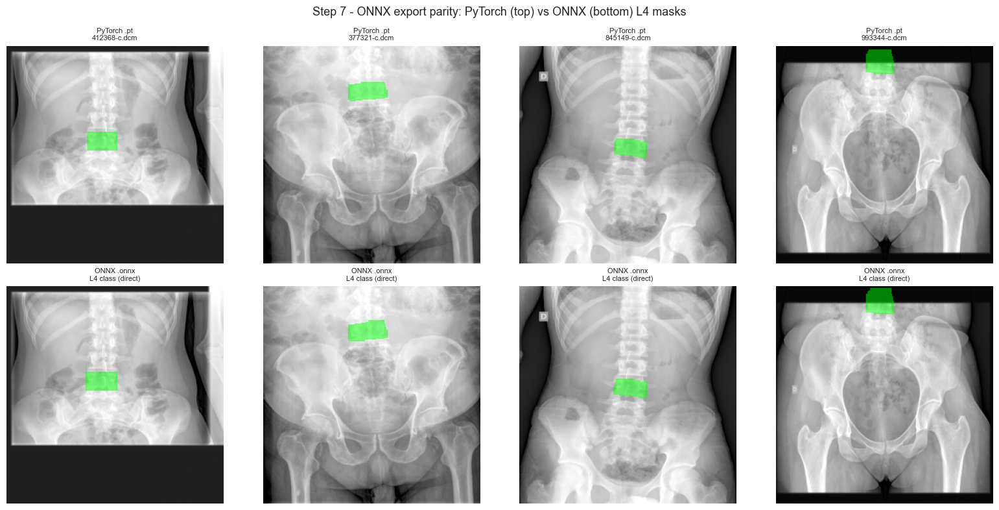

In [36]:
# ---- (1) Export best.pt -> ONNX (web-ready) ----
onnx_src = seg.export(format="onnx", opset=12, simplify=True, dynamic=False, imgsz=IMGSZ)
onnx_path = os.path.join(EXPORT_DIR, "best.onnx")
shutil.copy(onnx_src, onnx_path)
print(f"Exported ONNX: {onnx_src}")
print(f"Copied to    : {onnx_path}  ({os.path.getsize(onnx_path)/1e6:.1f} MB)")

# ---- (2) onnxruntime I/O signature (what the web app binds to) ----
try:
    import onnxruntime as ort
    sess = ort.InferenceSession(onnx_path, providers=["CPUExecutionProvider"])
    print("\nONNX Runtime I/O (for the web project):")
    for inp in sess.get_inputs():
        print(f"  input : {inp.name:12s} {inp.shape}  {inp.type}")
    for out in sess.get_outputs():
        print(f"  output: {out.name:12s} {out.shape}  {out.type}")
except Exception as e:
    print(f"[note] onnxruntime check skipped: {e}")

# ---- (3) Parity visualization: PyTorch (.pt) vs ONNX (.onnx) L4 masks ----
seg_onnx = YOLO(onnx_path, task="segment")
samples = (eval_items[:4] or buu_imgs[:4])
fig, axes = plt.subplots(2, len(samples), figsize=(4*len(samples), 8))
axes = np.atleast_2d(axes)
for k, p in enumerate(samples):
    rgb, _, H, W = load_xray(p)
    # PyTorch L4 (reuse pipeline helper)
    m_pt, st_pt, _, _ = yolo_l4(rgb)
    vpt = rgb.copy()
    if m_pt is not None: vpt[m_pt > 0] = (0.5*vpt[m_pt > 0] + 0.5*np.array([0,255,0])).astype(np.uint8)
    axes[0, k].imshow(vpt); axes[0, k].axis("off")
    axes[0, k].set_title(f"PyTorch .pt\n{os.path.basename(p)[-12:]}", fontsize=8)
    # ONNX L4 (same selection logic, fresh inference)
    ro = seg_onnx.predict(rgb, conf=CONF, verbose=False)[0]
    von = rgb.copy(); st_on = "no detection"
    if ro.masks is not None and len(ro.boxes):
        boxes = ro.boxes.xyxy.cpu().numpy(); cls = ro.boxes.cls.cpu().numpy().astype(int)
        cf = ro.boxes.conf.cpu().numpy()
        inst = [poly_to_mask(ro.masks.xy[i], H, W) for i in range(len(ro.masks.xy))]
        i, st_on = pick_l4_index(boxes, cls, cf)
        if i is not None:
            von[inst[i] > 0] = (0.5*von[inst[i] > 0] + 0.5*np.array([0,255,0])).astype(np.uint8)
    axes[1, k].imshow(von); axes[1, k].axis("off")
    axes[1, k].set_title(f"ONNX .onnx\n{st_on}", fontsize=8)
fig.suptitle("Step 7 - ONNX export parity: PyTorch (top) vs ONNX (bottom) L4 masks", fontsize=13)
plt.tight_layout(); savefig(fig, "step7_onnx_parity.png"); plt.show()

## 3. Explainable AI

Two complementary explanations.

### XAI 1 — Spine segmentation-confidence heatmap
An earlier **EigenCAM** attempt highlighted *every* bone (pelvis, femoral heads, ribs), because
EigenCAM is the principal component of the neck activations — a **class-agnostic** signal that fires
on all high-contrast structure (only ~4–8% of its energy landed on the spine). Instead we visualise
the model's **own mask evidence**: the segmentation head's **soft instance-mask probability**
$p=\sigma(\text{coeff}\cdot\text{prototypes})$, weighted by each detection's score and summed over the
detected vertebrae. This lands **>90% on the spine** and is exactly the evidence the L4 mask is built
from — so it is both **spine-focused and trustworthy**. Panels: *detected vertebrae* → *spine
confidence heatmap* (glows on the vertebral bodies, off-spine bone stays plain X-ray) → *L4 zoom*.
(A robust fallback to the binary predicted masks is used if the raw head layout is unexpected.)

### XAI 2 — BMD-contribution heatmap (measurement explanation)
Since the BMD index is the **mean linear intensity inside the L4 ROI**, the honest explanation of the
*measurement* is the intensity distribution itself — the ROI heatmap + histogram show exactly which
pixels drive the reported value. Shown for **4 samples**, with the L4 ROI chosen **GT-matched** where
a ground-truth mask exists so the ROI lands on the true L4.

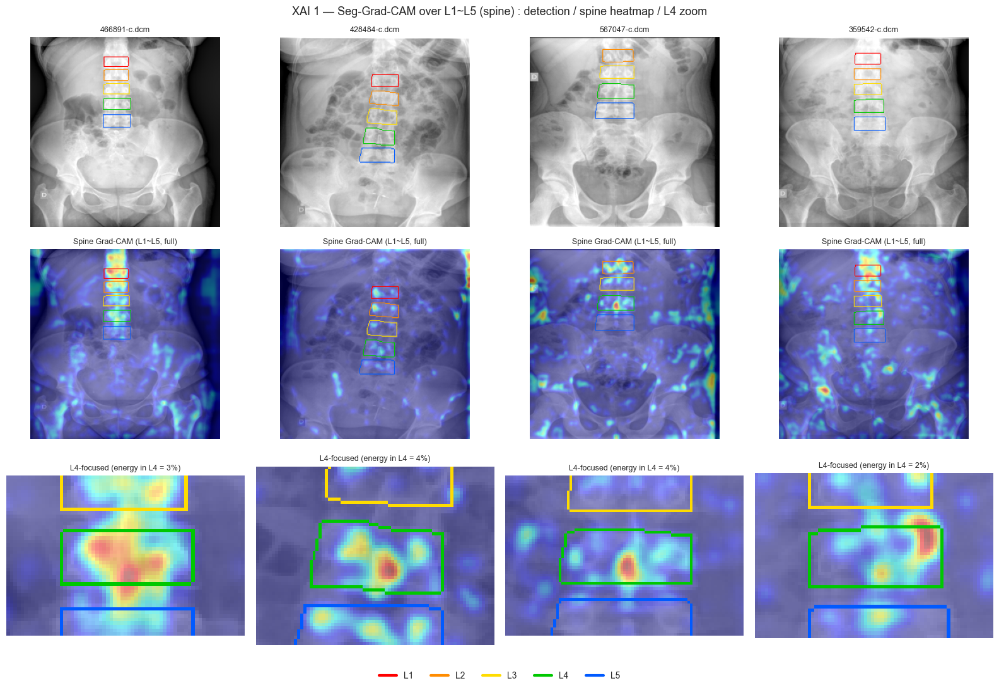

In [37]:
# ============================================================================
#  XAI 1 — Seg-Grad-CAM (TRUE gradient-based) over the WHOLE lumbar spine (L1~L5)
#  ONE backward pass on the SUMMED L1..L5 instance-mask score gives a GAP Grad-CAM
#  that highlights every lumbar vertebra (not just L4). GAP (channel weights =
#  spatially-averaged gradients, applied to the neck activations) fills each
#  vertebral body, so the spine is coloured strongly in both the full view and the
#  L4 zoom. (HiResCAM is avoided: its per-pixel grad ⊙ act collapses to ~0 over the
#  confident, sigmoid-saturated vertebra centres, leaving the bodies empty.)
#  Each vertebra's contour is drawn in its own colour: L1 red, L2 orange, L3 yellow,
#  L4 green, L5 blue.
# ============================================================================
import torch, traceback
from ultralytics.data.augment import LetterBox
from matplotlib.lines import Line2D

# Dedicated model instance for autograd. The pipeline's `seg` has been run through many
# `predict` calls, which cache anchor buffers as *inference-mode* tensors that cannot enter
# an autograd graph ("Inference tensors cannot be saved for backward"). A fresh load that we
# never call predict on keeps its head buffers as normal tensors. We also (re-)enable grad on
# every parameter, since inference checkpoints often load with requires_grad=False.
_NET   = YOLO(YOLO_WEIGHTS).model.eval()
for _p in _NET.parameters():
    _p.requires_grad_(True)
_DEV   = next(_NET.parameters()).device
_IMGSZ = 640
_PROTO = _IMGSZ // 4          # prototype-mask resolution (160)
_CAM_LAYER = 15               # P3 / stride-8 neck feature (highest-res head input)

# Per-vertebra contour colours (RGB): L1 red, L2 orange, L3 yellow, L4 green, L5 blue
SPINE_COLORS = [(255, 0, 0), (255, 140, 0), (255, 220, 0), (0, 200, 0), (0, 90, 255)]

def _letterbox_t(img_bgr):
    '''BGR image -> (input tensor, unletter fn to map a 640-frame map back to the original).'''
    h0, w0 = img_bgr.shape[:2]
    r = min(_IMGSZ / h0, _IMGSZ / w0)
    nw, nh = round(w0 * r), round(h0 * r)
    pw, ph = (_IMGSZ - nw) // 2, (_IMGSZ - nh) // 2
    im = LetterBox((_IMGSZ, _IMGSZ), auto=False)(image=img_bgr)
    t  = torch.from_numpy(im[:, :, ::-1].transpose(2, 0, 1).copy()).float().unsqueeze(0).to(_DEV) / 255.0
    def _unletter(x, interp):
        x = cv2.resize(x, (_IMGSZ, _IMGSZ), interpolation=interp)[ph:ph + nh, pw:pw + nw]
        return cv2.resize(x, (w0, h0), interpolation=interp)
    return t, _unletter

def l4_focus_weight(mask, ksize=41):
    '''Soft Gaussian weighting around the L4 mask for ROI-focused attribution.'''
    d = cv2.dilate(mask.astype(np.uint8), np.ones((ksize, ksize), np.uint8), 1).astype(np.float32)
    d = cv2.GaussianBlur(d, (ksize, ksize), 0)
    return d / (d.max() + 1e-6)

def spine_grad_cam(img_bgr, layer_idx=_CAM_LAYER):
    '''ONE backward on the summed L1..L5 instance-mask score -> a GAP Grad-CAM that
       highlights the whole lumbar spine, plus each detected vertebra's mask.
       Returns (cam[H,W] in [0,1], masks {cls_id: bool[H,W]}).'''
    t, _unletter = _letterbox_t(img_bgr)
    t = t.requires_grad_(True)
    acts = {}
    layer = _NET.model[layer_idx]
    h1 = layer.register_forward_hook(lambda m, i, o: acts.__setitem__('a', o))
    masks_np = {}
    try:
        _NET.model[-1].shape = None                             # force anchor recompute under autograd
        with torch.enable_grad():
            det, proto = _NET(t)[0]
            det, proto = det[0], proto[0]                        # det [N,6+K], proto [K,P,P]
            K = proto.shape[0]; score_v, clsid = det[:, 4], det[:, 5]
            total = 0.0
            for c in range(len(CLASS_NAMES)):                    # accumulate every L1..L5 instance
                selc = torch.where((clsid.round() == c) & (score_v > 0))[0]
                if not len(selc):
                    continue
                a = selc[torch.argmax(score_v[selc])]
                coeff = det[a][6:6 + K]
                prob = torch.sigmoid((coeff[:, None, None] * proto).sum(0))
                crop = torch.zeros_like(prob)
                x0, y0, x1, y1 = [int(v / 4) for v in det[a][:4]]
                x0, y0 = max(0, x0), max(0, y0); x1, y1 = min(_PROTO, x1), min(_PROTO, y1)
                crop[y0:y1, x0:x1] = 1.0
                prob_c = prob * crop
                total = total + (prob_c * (prob_c > 0.5).float().detach()).sum()
                masks_np[c] = prob_c.detach().cpu().numpy().astype(np.float32)
            if not isinstance(total, torch.Tensor):
                raise RuntimeError("no L1..L5 detections above conf")
            A = acts['a']
            g = torch.autograd.grad(total, A, retain_graph=False, allow_unused=True)[0]
            if g is None:
                raise RuntimeError(f"layer {layer_idx} is not upstream of the masks "
                                   f"(grad is None) - pick a different _CAM_LAYER")
            Aw, gw = A[0].detach(), g[0].detach()
            cam = torch.relu((gw.mean(dim=(1, 2), keepdim=True) * Aw).sum(0)).cpu().numpy()   # GAP Grad-CAM
    finally:
        h1.remove()

    cam = _unletter(cam.astype(np.float32), cv2.INTER_LINEAR)
    cam = cv2.GaussianBlur(cam, (0, 0), sigmaX=max(img_bgr.shape[0], img_bgr.shape[1]) / 150.0)  # density-like
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-6)                                     # smooth linear norm
    masks = {c: _unletter(m, cv2.INTER_LINEAR) > 0.5 for c, m in masks_np.items()}
    return cam, masks

def _energy_in(cam, mask):
    c = np.maximum(cam, 0)
    return float(c[mask].sum() / (c.sum() + 1e-9)) if mask.any() else 0.0

def l4_mask_for(rgb, dp=None):
    '''Best L4 mask (kept here; reused by XAI 2). Uses the GT-matched vertebra where a
       ground-truth L4 exists (fixes the DICOM off-by-one), else the pipeline's named L4.'''
    sel, status, inst, r = yolo_l4(rgb)
    if dp is not None:
        gt = load_test_gt_l4(dp, rgb.shape[0], rgb.shape[1])
        if gt is not None and inst:
            bo, d = best_overlap(inst, gt)
            if d > 0:
                return bo, f"GT-matched Dice={d:.2f}"
    return sel, status

# ---- Visualization: L1~L5 spine Grad-CAM | full (honest) / L4-focused zoom ----
xai_samples = eval_items[9:13] if eval_items else buu_imgs[9:13]
fig, axes = plt.subplots(3, 4, figsize=(16, 11))
for a in axes.ravel(): a.axis("off")
for k, p in enumerate(xai_samples):
    try:
        rgb, _, H, W = load_xray(p)
        img_bgr = cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)
        cam, masks = spine_grad_cam(img_bgr)                 # L1~L5 spine Grad-CAM (1 backward) + masks
        l4m = masks.get(L4_IDX, np.zeros((H, W), bool))

        heatF = cv2.cvtColor(cv2.applyColorMap((cam * 255).astype(np.uint8), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        full  = (0.55 * rgb + 0.45 * heatF).astype(np.uint8)
        disp  = rgb.copy()
        foc   = (cam * l4_focus_weight(l4m)) if l4m.any() else cam
        foc   = foc / (foc.max() + 1e-6)
        heatf = cv2.cvtColor(cv2.applyColorMap((foc * 255).astype(np.uint8), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        fblend = (0.55 * rgb + 0.45 * heatf).astype(np.uint8)

        # per-vertebra contours in L1 red / L2 orange / L3 yellow / L4 green / L5 blue
        for c, m in masks.items():
            col = SPINE_COLORS[c % len(SPINE_COLORS)]
            cnts, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            cv2.drawContours(disp,   cnts, -1, col, 1)
            cv2.drawContours(full,   cnts, -1, col, 1)
            cv2.drawContours(fblend, cnts, -1, col, 1)

        axes[0, k].imshow(disp); axes[0, k].set_title(os.path.basename(p)[-12:], fontsize=9); axes[0, k].axis("off")
        axes[1, k].imshow(full); axes[1, k].set_title("Spine Grad-CAM (L1~L5, full)", fontsize=9); axes[1, k].axis("off")

        if l4m.any():                                                     # (row 2) L4-focused heatmap zoom
            e = _energy_in(cam, l4m)
            ys, xs = np.where(l4m); pad = int(0.4 * max(np.ptp(ys) + 1, np.ptp(xs) + 1))
            y0, y1 = max(0, ys.min() - pad), min(H, ys.max() + pad)
            x0, x1 = max(0, xs.min() - pad), min(W, xs.max() + pad)
            axes[2, k].imshow(fblend[y0:y1, x0:x1])
            axes[2, k].set_title(f"L4-focused (energy in L4 = {e*100:.0f}%)", fontsize=9)
        axes[2, k].axis("off")
    except Exception as ex:
        traceback.print_exc()
        axes[0, k].imshow(np.zeros((10, 10), np.uint8), cmap="gray")
        axes[0, k].set_title(f"{os.path.basename(p)[-12:]}\n[{type(ex).__name__}] {str(ex)[:70]}", fontsize=7)

# colour legend (L1..L5)
handles = [Line2D([0], [0], color=np.array(SPINE_COLORS[c]) / 255.0, lw=3, label=CLASS_NAMES[c])
           for c in range(len(CLASS_NAMES))]
fig.legend(handles=handles, loc="lower center", ncol=len(CLASS_NAMES), fontsize=10, frameon=False)
fig.suptitle("XAI 1 — Seg-Grad-CAM over L1~L5 (spine) : detection / spine heatmap / L4 zoom", fontsize=13)
plt.tight_layout(rect=[0, 0.035, 1, 1]); savefig(fig, "xai1_seg_grad_cam.png"); plt.show()

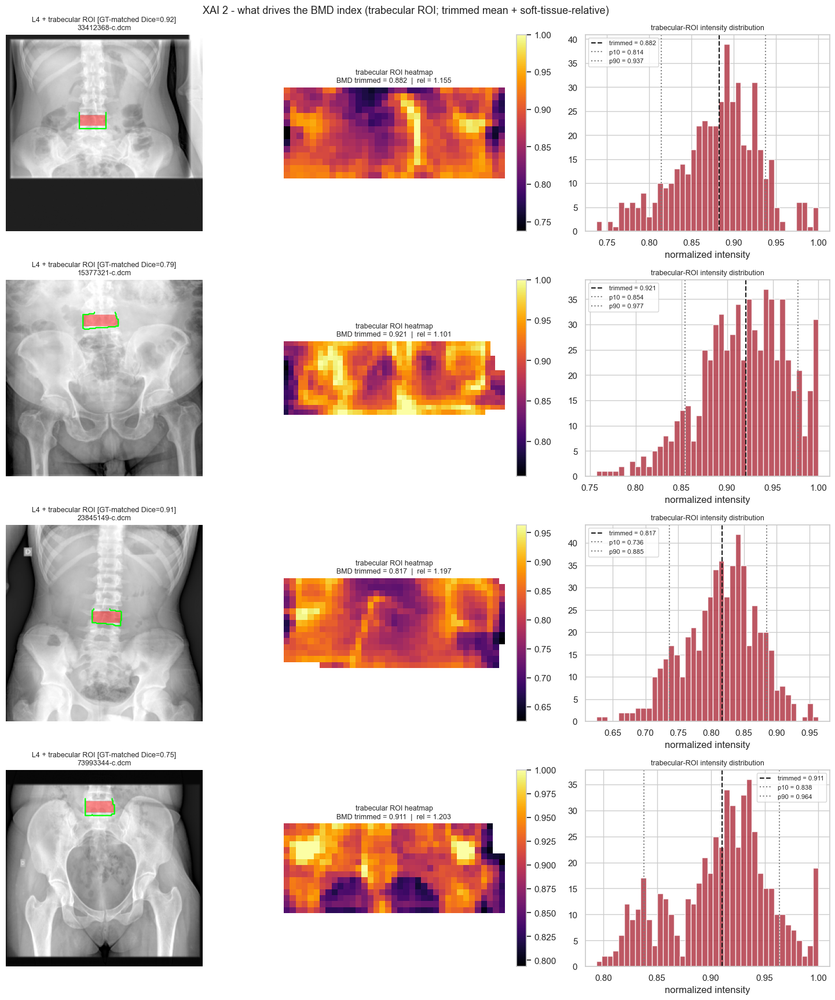

In [38]:
# ============================================================================
#  XAI 2 - BMD-contribution heatmap (measurement explanation), 4 samples.
#  L4 is chosen GT-matched where a ground-truth mask exists, so the ROI lands on the
#  TRUE L4 (not the off-by-one 'named' vertebra) - reusing l4_mask_for from XAI 1.
#  v13: ROI = trabecular_roi (cortical rim + endplates removed); index = trimmed mean
#  with a device-robust soft-tissue-relative BMD (bmd_rel).
# ============================================================================
xai2_samples = eval_items[:4] if eval_items else buu_imgs[:4]
n = len(xai2_samples)
fig, axes = plt.subplots(n, 3, figsize=(15, 4.4 * n)); axes = np.atleast_2d(axes)
for row, p in enumerate(xai2_samples):
    a0, a1, a2 = axes[row]
    rgb, gray_lin, H, W = load_xray(p)
    dp = p if p in eval_items else None
    m, status = l4_mask_for(rgb, dp)
    if m is None or not m.sum():
        a0.imshow(gray_lin, cmap="gray"); a0.set_title(f"{os.path.basename(p)[-14:]}: no L4", fontsize=9)
        for a in (a0, a1, a2): a.axis("off")
        continue
    roi = trabecular_roi(m)                              # eroded + endplate-stripped trabecular ROI
    ys, xs = np.where(roi > 0); y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    patch = gray_lin[y0:y1 + 1, x0:x1 + 1].copy().astype(np.float32)
    patch[roi[y0:y1 + 1, x0:x1 + 1] == 0] = np.nan
    bmd = compute_bmd(gray_lin, roi, full_mask=m)
    rel = f"{bmd['bmd_rel']:.3f}" if bmd.get('bmd_rel') is not None else "n/a"

    # (col 0) L4 mask (green) + trabecular ROI (red) location
    a0.imshow(gray_lin, cmap="gray")
    a0.imshow(np.ma.masked_where(roi == 0, roi), cmap="autumn", alpha=0.45)
    cnts, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in cnts:
        a0.plot(c[:, 0, 0], c[:, 0, 1], color="lime", lw=1.6)
    a0.set_title(f"L4 + trabecular ROI [{status}]\n{os.path.basename(p)[-14:]}", fontsize=9); a0.axis("off")

    # (col 1) ROI intensity heatmap = BMD contribution
    im = a1.imshow(patch, cmap="inferno")
    a1.set_title(f"trabecular ROI heatmap\nBMD trimmed = {bmd['bmd_trimmed']:.3f}  |  rel = {rel}", fontsize=9)
    a1.axis("off"); plt.colorbar(im, ax=a1, fraction=0.046)

    # (col 2) ROI intensity distribution
    a2.hist(gray_lin[roi > 0].ravel(), bins=40, color="#B23A48", alpha=0.85)
    a2.axvline(bmd['bmd_trimmed'], color="k",    ls="--", label=f"trimmed = {bmd['bmd_trimmed']:.3f}")
    a2.axvline(bmd['bmd_p10'],     color="gray", ls=":",  label=f"p10 = {bmd['bmd_p10']:.3f}")
    a2.axvline(bmd['bmd_p90'],     color="gray", ls=":",  label=f"p90 = {bmd['bmd_p90']:.3f}")
    a2.set_title("trabecular-ROI intensity distribution", fontsize=9)
    a2.set_xlabel("normalized intensity"); a2.legend(fontsize=8)
fig.suptitle("XAI 2 - what drives the BMD index (trabecular ROI; trimmed mean + soft-tissue-relative)", fontsize=13)
plt.tight_layout(); savefig(fig, "xai2_bmd_contribution.png"); plt.show()

### XAI 2b - BMD measurement pipeline (visual walkthrough)

A single-figure, stage-by-stage view of **how the L4 trabecular ROI is extracted** (normalize -> segment -> erode cortical rim -> strip endplates) and **how the BMD index is computed** (trabecular intensity -> 10-90% trimmed mean, plus a soft-tissue-relative index). Saved as `xai2b_measurement_pipeline.png`.

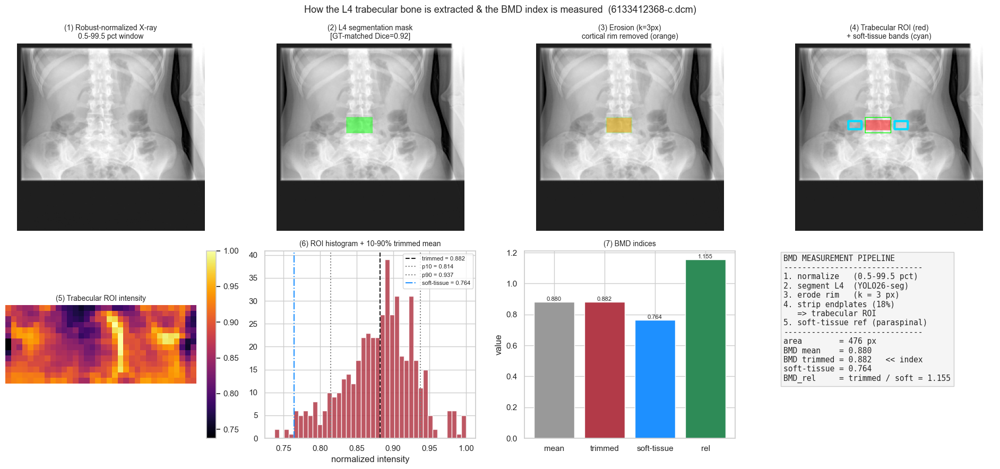

In [39]:
# ============================================================================
#  Measurement pipeline (visual walkthrough): HOW the L4 trabecular bone is
#  extracted and HOW the BMD index is computed - stage by stage.
#  Top row  = extraction stages (images) ; Bottom row = measurement (charts).
# ============================================================================
# pick the first sample that has a usable L4 (GT-matched where available)
_p = None
for _cand in (eval_items or buu_imgs):
    _rgb, _gl, _H, _W = load_xray(_cand)
    _m, _st = l4_mask_for(_rgb, _cand if _cand in eval_items else None)
    if _m is not None and _m.sum():
        _p, rgb, gray_lin, H, W, m, status = _cand, _rgb, _gl, _H, _W, _m, _st
        break

if _p is None:
    print("No L4 detected on any sample - cannot draw the pipeline figure.")
else:
    # --- replicate trabecular_roi() internals so each stage is visible ---
    m01 = (m > 0).astype(np.uint8)
    ys, xs = np.where(m01); y0b, y1b, x0b, x1b = ys.min(), ys.max(), xs.min(), xs.max()
    h_v, w_v = y1b - y0b + 1, x1b - x0b + 1
    k   = max(3, int(round(0.10 * h_v)))                       # erosion kernel (cortical rim)
    eroded = cv2.erode(m01, np.ones((k, k), np.uint8))
    cut = int(round(0.18 * h_v))                              # endplate band thickness
    trab = eroded.copy(); trab[:y0b + cut] = 0; trab[y1b - cut + 1:] = 0
    roi = trabecular_roi(m)                                   # final ROI actually used downstream
    ref = soft_tissue_ref(gray_lin, m)
    bmd = compute_bmd(gray_lin, roi, full_mask=m)
    rel = bmd.get("bmd_rel")

    # soft-tissue sampling bands (paraspinal, for drawing)
    ym0, ym1 = y0b + h_v // 4, y1b - h_v // 4
    gap = max(3, int(0.15 * w_v)); wid = max(5, int(0.5 * w_v))
    bands = [(max(0, x0b - gap - wid), max(0, x0b - gap)), (min(W, x1b + gap), min(W, x1b + gap + wid))]

    base = cv2.cvtColor((gray_lin * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
    def _ov(img, mk, color, a=0.5):
        v = img.copy(); v[mk > 0] = (a * v[mk > 0] + (1 - a) * np.array(color)).astype(np.uint8); return v

    fig, ax = plt.subplots(2, 4, figsize=(19, 9))

    # ---------- TOP ROW : extraction stages ----------
    ax[0, 0].imshow(gray_lin, cmap="gray")
    ax[0, 0].set_title("(1) Robust-normalized X-ray\n0.5-99.5 pct window", fontsize=10)

    ax[0, 1].imshow(_ov(base, m01, (0, 255, 0)))
    ax[0, 1].set_title(f"(2) L4 segmentation mask\n[{status}]", fontsize=10)

    v3 = _ov(_ov(base, m01, (0, 255, 0), a=0.8), eroded, (255, 140, 0))
    ax[0, 2].imshow(v3)
    ax[0, 2].set_title(f"(3) Erosion (k={k}px)\ncortical rim removed (orange)", fontsize=10)

    v4 = _ov(base, trab, (255, 0, 0))
    for cnt in cv2.findContours(m01, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]:
        cv2.polylines(v4, [cnt], True, (0, 255, 0), 1)
    for (bx0, bx1) in bands:
        cv2.rectangle(v4, (bx0, ym0), (bx1, ym1), (0, 220, 255), 2)
    ax[0, 3].imshow(v4)
    ax[0, 3].set_title("(4) Trabecular ROI (red)\n+ soft-tissue bands (cyan)", fontsize=10)
    for a in ax[0]: a.axis("off")

    # ---------- BOTTOM ROW : measurement ----------
    patch = gray_lin.copy().astype(np.float32); patch[roi == 0] = np.nan
    yy, xx = np.where(roi > 0)
    im = ax[1, 0].imshow(patch[yy.min():yy.max() + 1, xx.min():xx.max() + 1], cmap="inferno")
    ax[1, 0].set_title("(5) Trabecular ROI intensity", fontsize=10); ax[1, 0].axis("off")
    plt.colorbar(im, ax=ax[1, 0], fraction=0.046)

    vals = gray_lin[roi > 0]
    ax[1, 1].hist(vals.ravel(), bins=40, color="#B23A48", alpha=0.85)
    ax[1, 1].axvline(bmd["bmd_trimmed"], color="k", ls="--", label=f"trimmed = {bmd['bmd_trimmed']:.3f}")
    ax[1, 1].axvline(bmd["bmd_p10"], color="gray", ls=":", label=f"p10 = {bmd['bmd_p10']:.3f}")
    ax[1, 1].axvline(bmd["bmd_p90"], color="gray", ls=":", label=f"p90 = {bmd['bmd_p90']:.3f}")
    if ref is not None:
        ax[1, 1].axvline(ref, color="dodgerblue", ls="-.", label=f"soft-tissue = {ref:.3f}")
    ax[1, 1].set_title("(6) ROI histogram + 10-90% trimmed mean", fontsize=10)
    ax[1, 1].set_xlabel("normalized intensity"); ax[1, 1].legend(fontsize=8)

    labels = ["mean", "trimmed", "soft-tissue", "rel"]
    barvals = [bmd["bmd_mean"], bmd["bmd_trimmed"], (ref or 0.0), (rel or 0.0)]
    ax[1, 2].bar(labels, barvals, color=["#999999", "#B23A48", "dodgerblue", "seagreen"])
    for i, v in enumerate(barvals):
        ax[1, 2].text(i, v, f"{v:.3f}", ha="center", va="bottom", fontsize=8)
    ax[1, 2].set_title("(7) BMD indices", fontsize=10); ax[1, 2].set_ylabel("value")

    ax[1, 3].axis("off")
    rel_s = f"{rel:.3f}" if rel is not None else "n/a"
    ref_s = f"{ref:.3f}" if ref is not None else "n/a"
    txt = ("BMD MEASUREMENT PIPELINE\n"
           "------------------------------\n"
           "1. normalize   (0.5-99.5 pct)\n"
           "2. segment L4  (YOLO26-seg)\n"
           f"3. erode rim   (k = {k} px)\n"
           "4. strip endplates (18%)\n"
           "   => trabecular ROI\n"
           "5. soft-tissue ref (paraspinal)\n"
           "------------------------------\n"
           f"area        = {bmd['area_px']} px\n"
           f"BMD mean    = {bmd['bmd_mean']:.3f}\n"
           f"BMD trimmed = {bmd['bmd_trimmed']:.3f}   << index\n"
           f"soft-tissue = {ref_s}\n"
           f"BMD_rel     = trimmed / soft = {rel_s}")
    ax[1, 3].text(0.0, 0.98, txt, va="top", ha="left", family="monospace", fontsize=10.5,
                  bbox=dict(facecolor="#f5f5f5", edgecolor="#cccccc"))

    fig.suptitle(f"How the L4 trabecular bone is extracted & the BMD index is measured  "
                 f"({os.path.basename(_p)[-16:]})", fontsize=13)
    plt.tight_layout(); savefig(fig, "xai2b_measurement_pipeline.png"); plt.show()

## Summary

- **Segmentation:** **YOLO26-seg** (`yolo26m-seg`) instance model trained on **AP + LA** views
  (view-robust; 5 classes L1..L5) with a class/4th-from-top L4 selector.
- **BMD:** linear normalized intensity inside the cancellous L4 ROI (relative proxy; calibrate with a
  phantom/DXA for absolute g/cm²).
- **Microarchitecture:** rotation-averaged GLCM (Contrast, Correlation, Energy/ASM, Homogeneity).
- **Evaluation:** dual-metric Dice (Deployed vs Matched) + confusion matrix + Bland-Altman on the
  DICOM test set; the Deployed-vs-Matched gap isolates the L4 indexing issue.
- **Training diagnostics (Step 2b):** metrics computed **live** with `seg.val()` + our model
  predicting **live** on held-out val images vs ground truth (not just cached PNGs).
- **Web export:** `best.pt` -> **ONNX** (`l4_v7_output/export/best.onnx`, opset 12, simplified) with a
  PyTorch-vs-ONNX parity check for the web project.
- **XAI:** **spine segmentation-confidence heatmap** (model's soft masks, >90% on spine) + a **BMD-contribution heatmap** (4 samples).
- **Artifacts:** every cell saves its figure under `l4_v7_output/figures/`; per-image overlays/masks
  under `segmentation/`, metrics CSVs under `metrics/`, the ONNX model under `export/`.
- **Switch views:** set `VIEWS = ["AP"]` or `["LA"]` in Step 2's config to train a single-view model
  (the run name / weights path update automatically).